## Оценка вероятности дефолта (PD) для корпоративных заемщиков отрасли «Металлургия» с использованием методов машинного обучения.

Проект по Риск-менеджменту

Андреев Иван, Андрюхин Борис, Гусева Людмила, Крайнова Софья, Арефьева Софья 

### 1. Импорт библиотек и чтение датасета.

In [93]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from category_encoders import TargetEncoder
from sklearn.preprocessing import StandardScaler
import optuna
from catboost import CatBoostClassifier
from sklearn.metrics import roc_auc_score, average_precision_score
from sklearn.preprocessing import TargetEncoder
from sklearn.preprocessing import OneHotEncoder
from optuna import Trial
from sklearn.compose import ColumnTransformer
from optuna.samplers import TPESampler

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
import itertools

import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest
from sklearn.metrics import roc_auc_score, average_precision_score
import optuna


import pandas as pd
import requests
import datetime as dt
from tqdm import tqdm
import xml.etree.ElementTree as ET
from requests import ConnectTimeout
from requests import ReadTimeout
from pathlib import Path

import folium
import missingno as msno
from typing import Iterable

from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

import csv
import math
import scipy.stats as st
import itertools as it
import numpy.matlib as nm
from sklearn import metrics
import sklearn.model_selection as ms
import sklearn.metrics as metrics
from statsmodels.miscmodels.ordinal_model import OrderedModel
from sklearn import linear_model
import statsmodels.api as sm
import missingno as msno
from impyute.imputation.cs.em import em
from sklearn.impute import KNNImputer
import random
from sklearn.model_selection import train_test_split
from imblearn.under_sampling import NearMiss
from imblearn.over_sampling import SMOTE

%config InlineBackend.figure_format = 'retina'
sns.set(style='darkgrid', palette='deep')
plt.rcParams['figure.figsize'] = 12, 6
plt.rcParams['font.size'] = 12
plt.rcParams['savefig.format'] = 'pdf'

Основным источником данных является СПАРК. Мы имеем ограничение по выгрузке в 10 000 уникальных компаний за один раз. Поэтому, максимизируя полезность, выгружаем отдельно максимально возможное количество действующих и ликвидированных компаний по признаку "Статус" от СПАРКа. Каждая выгрузка содержит информацию о компаниях во временном промежутке с 2020-ого по 2024-ый год. Также фильтруем ликвидированных по дате ликвидации с 2021-ого года, чтобы мы могли использовать первый лаг финансовых показателей. Также на этапе формирования выборки отсекаем компании возрастом менее пяти лет.   

#### 1.1 Ликвидированные компании.

In [4]:
def melting(data):
    def parse_col(col):
        s = str(col).strip()
        if len(s) >= 4 and s[:4].isdigit():
            year = int(s[:4])
            feature = s[4:].lstrip(" ,;").strip()
            return year, feature
        else:
            return None

    parsed = {c: parse_col(c) for c in data.columns}
    year_cols = [c for c, v in parsed.items() if v is not None]
    id_cols = [c for c in data.columns if c not in year_cols]

    tmp = data.melt(
        id_vars=id_cols,
        value_vars=year_cols,
        var_name='raw_col',
        value_name='value'
    )
    tmp['Год'] = tmp['raw_col'].map(lambda c: parsed[c][0]).astype(int)
    tmp['Признак'] = tmp['raw_col'].map(lambda c: parsed[c][1]).str.strip()
    index_cols = id_cols + ['Год']

    data = (
        tmp
        .set_index(index_cols + ['Признак'])['value']
        .unstack('Признак')
        .reset_index()
    )
    data["Год наблюдения"] = data["Год"]
    data = data.drop(columns="Год") 
    return data

df = pd.read_excel("недейств.xlsx")
df.columns = df.iloc[2]
df = df.iloc[3:10003, 1:]
likvid = melting(df)
likvid

Признак,Наименование,Регистрационный номер,Краткое наименование,Дата регистрации,"Возраст компании, лет",Дата ликвидации,Статус,Код налогоплательщика,Регион регистрации,Наименование ОКАТО,...,"Проценты к получению, RUB","Проценты к уплате, RUB","Рентабельность активов (ROA), %","Рентабельность капитала (ROE), %","Собственный капитал, RUB","Соотношение совокупного долга к EBIT, %","Соотношение совокупного долга к капиталу, %","Чистая прибыль (убыток), RUB","Чистые активы, RUB",Год наблюдения
0,"1 ФАБРИКА КОВКИ, ООО",1145032005205,"ООО ""1 ФАБРИКА КОВКИ""",2014-06-09,11,2024-07-22,Недействующая,5032280871,Московская область,"Московская область, Одинцово",...,NaN,NaN,-8.9695,0.1595,-22862000,NaN,-1.008,-3377000,-22862000,2020
1,"1 ФАБРИКА КОВКИ, ООО",1145032005205,"ООО ""1 ФАБРИКА КОВКИ""",2014-06-09,11,2024-07-22,Недействующая,5032280871,Московская область,"Московская область, Одинцово",...,NaN,NaN,29.6575,-0.5023,-13683000,NaN,-0.9974,9179000,-13683000,2021
2,"1 ФАБРИКА КОВКИ, ООО",1145032005205,"ООО ""1 ФАБРИКА КОВКИ""",2014-06-09,11,2024-07-22,Недействующая,5032280871,Московская область,"Московская область, Одинцово",...,NaN,NaN,-9.2696,0.1104,-15283000,NaN,-0.9984,-1599000,-15283000,2022
3,"1 ФАБРИКА КОВКИ, ООО",1145032005205,"ООО ""1 ФАБРИКА КОВКИ""",2014-06-09,11,2024-07-22,Недействующая,5032280871,Московская область,"Московская область, Одинцово",...,NaN,NaN,-3.3925,0.0235,-15644000,NaN,-1.0024,-363000,-15644000,2023
4,"1 ФАБРИКА КОВКИ, ООО",1145032005205,"ООО ""1 ФАБРИКА КОВКИ""",2014-06-09,11,2024-07-22,Недействующая,5032280871,Московская область,"Московская область, Одинцово",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,"ЯРТ, ООО",1082222006250,"ООО ""ЯРТ""",2008-08-11,17,2021-12-06,Недействующая,2222075427,Алтайский край,"Алтайский край, Барнаул, Индустриальный",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020
49996,"ЯРТ, ООО",1082222006250,"ООО ""ЯРТ""",2008-08-11,17,2021-12-06,Недействующая,2222075427,Алтайский край,"Алтайский край, Барнаул, Индустриальный",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021
49997,"ЯРТ, ООО",1082222006250,"ООО ""ЯРТ""",2008-08-11,17,2021-12-06,Недействующая,2222075427,Алтайский край,"Алтайский край, Барнаул, Индустриальный",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022
49998,"ЯРТ, ООО",1082222006250,"ООО ""ЯРТ""",2008-08-11,17,2021-12-06,Недействующая,2222075427,Алтайский край,"Алтайский край, Барнаул, Индустриальный",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023


Для каждой компании оставляем только год ликвидации и предыдущий, чтобы осталась возможность посчитать первый лаг фин. показателей. Году ликвидации присваиваем метку дефолта

In [5]:
likvid = likvid[(likvid["Дата ликвидации"].dt.year == likvid["Год наблюдения"]) | (likvid["Дата ликвидации"].dt.year - likvid["Год наблюдения"] == 1) | (likvid["Дата ликвидации"].dt.year - likvid["Год наблюдения"] == 2)]
likvid["def"] = 0
likvid.loc[likvid["Дата ликвидации"].dt.year == likvid["Год наблюдения"], "def"] = 1
likvid.loc[likvid["Дата ликвидации"].dt.year - likvid["Год наблюдения"] == 1, "def"] = 1
likvid.head(5)

C:\Users\Admin\AppData\Local\Temp\ipykernel_134832\3610259835.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  likvid["def"] = 0


Признак,Наименование,Регистрационный номер,Краткое наименование,Дата регистрации,"Возраст компании, лет",Дата ликвидации,Статус,Код налогоплательщика,Регион регистрации,Наименование ОКАТО,...,"Проценты к уплате, RUB","Рентабельность активов (ROA), %","Рентабельность капитала (ROE), %","Собственный капитал, RUB","Соотношение совокупного долга к EBIT, %","Соотношение совокупного долга к капиталу, %","Чистая прибыль (убыток), RUB","Чистые активы, RUB",Год наблюдения,def
2,"1 ФАБРИКА КОВКИ, ООО",1145032005205,"ООО ""1 ФАБРИКА КОВКИ""",2014-06-09,11,2024-07-22,Недействующая,5032280871,Московская область,"Московская область, Одинцово",...,NaN,-9.2696,0.1104,-15283000,NaN,-0.9984,-1599000,-15283000,2022,0
3,"1 ФАБРИКА КОВКИ, ООО",1145032005205,"ООО ""1 ФАБРИКА КОВКИ""",2014-06-09,11,2024-07-22,Недействующая,5032280871,Московская область,"Московская область, Одинцово",...,NaN,-3.3925,0.0235,-15644000,NaN,-1.0024,-363000,-15644000,2023,1
4,"1 ФАБРИКА КОВКИ, ООО",1145032005205,"ООО ""1 ФАБРИКА КОВКИ""",2014-06-09,11,2024-07-22,Недействующая,5032280871,Московская область,"Московская область, Одинцово",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2024,1
7,"15 АРСЕНАЛ ВМФ, АО",1104720002705,"АО ""15 АРСЕНАЛ ВМФ""",2000-01-28,25,2024-02-01,Недействующая,4720033695,Ленинградская область,"Ленинградская область, Ломоносовский район, Бо...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022,0
8,"15 АРСЕНАЛ ВМФ, АО",1104720002705,"АО ""15 АРСЕНАЛ ВМФ""",2000-01-28,25,2024-02-01,Недействующая,4720033695,Ленинградская область,"Ленинградская область, Ломоносовский район, Бо...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023,1


In [6]:
non_lag_cols = ['Наименование', 'Год наблюдения', 'def',
    'Регистрационный номер', 'Краткое наименование','Дата регистрации',
    'Возраст компании, лет', 'Дата ликвидации', 'Статус',
    'Код налогоплательщика', 'Регион регистрации', 'Наименование ОКАТО',
    'Вид деятельности/отрасль', 'Организационно-правовая форма', 'Принадлежность к госсектору']

financial_cols = [c for c in likvid.columns if c not in non_lag_cols]
for col in financial_cols:
    likvid[f"{col} L1"] = likvid.groupby("Регистрационный номер")[col].shift(1)
lag1_cols = [c for c in likvid.columns if c.endswith("L1")]
likvid = likvid[non_lag_cols + lag1_cols]
likvid = likvid[(likvid["Дата ликвидации"].dt.year == likvid["Год наблюдения"]) | (likvid["Дата ликвидации"].dt.year - likvid["Год наблюдения"] == 1)]
likvid = likvid.dropna(subset=lag1_cols, how="all")
for col in lag1_cols:
    likvid[col] = likvid[col].astype(float)
likvid.head(5)

C:\Users\Admin\AppData\Local\Temp\ipykernel_134832\2237220133.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  likvid[f"{col} L1"] = likvid.groupby("Регистрационный номер")[col].shift(1)
C:\Users\Admin\AppData\Local\Temp\ipykernel_134832\2237220133.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  likvid[f"{col} L1"] = likvid.groupby("Регистрационный номер")[col].shift(1)
C:\Users\Admin\AppData\Local\Temp\ipykernel_134832\2237220133.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy o

Признак,Наименование,Год наблюдения,def,Регистрационный номер,Краткое наименование,Дата регистрации,"Возраст компании, лет",Дата ликвидации,Статус,Код налогоплательщика,...,"Основные средства , RUB L1","Проценты к получению, RUB L1","Проценты к уплате, RUB L1","Рентабельность активов (ROA), % L1","Рентабельность капитала (ROE), % L1","Собственный капитал, RUB L1","Соотношение совокупного долга к EBIT, % L1","Соотношение совокупного долга к капиталу, % L1","Чистая прибыль (убыток), RUB L1","Чистые активы, RUB L1"
3,"1 ФАБРИКА КОВКИ, ООО",2023,1,1145032005205,"ООО ""1 ФАБРИКА КОВКИ""",2014-06-09,11,2024-07-22,Недействующая,5032280871,...,NaN,NaN,NaN,-9.2696,0.1104,-15283000.0,NaN,-0.9984,-1599000.0,-15283000.0
4,"1 ФАБРИКА КОВКИ, ООО",2024,1,1145032005205,"ООО ""1 ФАБРИКА КОВКИ""",2014-06-09,11,2024-07-22,Недействующая,5032280871,...,NaN,NaN,NaN,-3.3925,0.0235,-15644000.0,NaN,-1.0024,-363000.0,-15644000.0
12,"160 ЭМЗ, ООО",2022,1,5117746069161,"ООО ""160 ЭМЗ""",2011-12-29,13,2023-07-20,Недействующая,7719800591,...,NaN,NaN,NaN,NaN,NaN,-14333000.0,NaN,NaN,NaN,-14333000.0
13,"160 ЭМЗ, ООО",2023,1,5117746069161,"ООО ""160 ЭМЗ""",2011-12-29,13,2023-07-20,Недействующая,7719800591,...,NaN,NaN,NaN,NaN,NaN,-1108000.0,NaN,NaN,NaN,-1108000.0
16,"18 АРСЕНАЛ ВМФ, АО",2021,1,1107847208952,"АО ""18 АРСЕНАЛ ВМФ""",2001-05-07,24,2021-12-30,Недействующая,7843311429,...,NaN,NaN,NaN,1.2771,-1.0809,-41659000.0,NaN,NaN,60014000.0,-41659000.0


Среди отобранных ликвидированных компаний не было найдено отчетностей с отрицальным совокупным долгом. Поэтому отрицательный Debt/Equity может появиться только благодаря отрицательному собственному капиталу. В таком случае установим Debt/Equity, равным 10 + |Debt/Equity|. Будем считать банкротами те ликвидированные компании, у которых Debt/Equity > 1.

In [7]:
likvid[(likvid['Заёмные средства (долгосрочные), RUB L1'] + likvid['Заёмные средства (краткосрочные), RUB L1'] > 0) |
        (likvid['Заёмные средства (долгосрочные), RUB L1'].isna()) | (likvid['Заёмные средства (краткосрочные), RUB L1'].isna())]
likvid.loc[likvid["Соотношение совокупного долга к капиталу, % L1"] < 0, 
           "Соотношение совокупного долга к капиталу, % L1"] = 10 + likvid.loc[likvid["Соотношение совокупного долга к капиталу, % L1"] < 0, "Соотношение совокупного долга к капиталу, % L1"].abs()
likvid = likvid[likvid["Соотношение совокупного долга к капиталу, % L1"] > 1]

likvid.loc[(likvid['Собственный капитал, RUB L1'] < 0) & (likvid['Чистая прибыль (убыток), RUB L1'] < 0), 
           'Рентабельность капитала (ROE), % L1'] = -1 * likvid.loc[(likvid['Собственный капитал, RUB L1'] < 0) & (likvid['Чистая прибыль (убыток), RUB L1'] < 0), 'Рентабельность капитала (ROE), % L1'] - 10
likvid.loc[(likvid['Внеоборотные активы, RUB L1'] + likvid['Оборотные активы, RUB L1'] < 0) & (likvid['Чистая прибыль (убыток), RUB L1'] < 0), 
           'Рентабельность активов (ROA), % L1'] = -1 * likvid.loc[(likvid['Внеоборотные активы, RUB L1'] + likvid['Оборотные активы, RUB L1'] < 0) & (likvid['Чистая прибыль (убыток), RUB L1'] < 0), 'Рентабельность активов (ROA), % L1'] - 10

likvid

Признак,Наименование,Год наблюдения,def,Регистрационный номер,Краткое наименование,Дата регистрации,"Возраст компании, лет",Дата ликвидации,Статус,Код налогоплательщика,...,"Основные средства , RUB L1","Проценты к получению, RUB L1","Проценты к уплате, RUB L1","Рентабельность активов (ROA), % L1","Рентабельность капитала (ROE), % L1","Собственный капитал, RUB L1","Соотношение совокупного долга к EBIT, % L1","Соотношение совокупного долга к капиталу, % L1","Чистая прибыль (убыток), RUB L1","Чистые активы, RUB L1"
3,"1 ФАБРИКА КОВКИ, ООО",2023,1,1145032005205,"ООО ""1 ФАБРИКА КОВКИ""",2014-06-09,11,2024-07-22,Недействующая,5032280871,...,NaN,NaN,NaN,-9.2696,-10.1104,-15283000.0,NaN,10.9984,-1599000.0,-15283000.0
4,"1 ФАБРИКА КОВКИ, ООО",2024,1,1145032005205,"ООО ""1 ФАБРИКА КОВКИ""",2014-06-09,11,2024-07-22,Недействующая,5032280871,...,NaN,NaN,NaN,-3.3925,-10.0235,-15644000.0,NaN,11.0024,-363000.0,-15644000.0
101,"73 ЦЗПУО, ОАО",2021,1,1091516001411,"ОАО ""73 ЦЗПУО""",2000-04-18,25,2022-01-31,Недействующая,1516620095,...,46207000.0,NaN,NaN,-0.0425,-0.2726,7731000.0,-15.5843,4.9609,-2461000.0,7731000.0
312,"АБСОЛЮТ СТРОЙ, ООО",2022,1,1202300064295,"ООО ""АБСОЛЮТ СТРОЙ""",2020-11-24,5,2022-12-09,Недействующая,2312296861,...,NaN,NaN,NaN,0.0091,0.5714,18000.0,NaN,67.4444,8000.0,18000.0
356,"АБФ, ООО",2021,1,1147748153684,"ООО ""АБФ""",2014-12-25,10,2021-09-23,Недействующая,7733186775,...,NaN,NaN,NaN,NaN,NaN,128000.0,NaN,3.3281,NaN,128000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49633,"ЮГПРОМИНВЕСТ, ООО",2023,1,1116154004944,"ООО ""ЮГПРОМИНВЕСТ""",2011-09-15,14,2024-08-19,Недействующая,6154571968,...,NaN,NaN,NaN,NaN,NaN,-2292000.0,NaN,11.5271,NaN,-2292000.0
49759,"ЮНИКО МЕТАЛЛ, ООО",2024,1,1055404078950,"ООО ""ЮНИКО МЕТАЛЛ""",2005-05-31,20,2025-04-23,Недействующая,5404248574,...,71000.0,6000.0,4884000.0,-1.7856,-13.8170,-182410000.0,-0.0510,10.0666,-239388000.0,-182410000.0
49768,"ЮНИПРОМ, ООО",2023,1,5067847432791,"ООО ""ЮНИПРОМ""",2006-10-11,19,2024-07-18,Недействующая,7810075744,...,NaN,NaN,NaN,-0.0094,-0.0266,519000.0,NaN,1.6224,-14000.0,519000.0
49769,"ЮНИПРОМ, ООО",2024,1,5067847432791,"ООО ""ЮНИПРОМ""",2006-10-11,19,2024-07-18,Недействующая,7810075744,...,NaN,NaN,NaN,NaN,NaN,500000.0,NaN,1.6840,NaN,500000.0


In [8]:
likvid = likvid[non_lag_cols + ['EBIT, RUB L1', 'Чистая прибыль (убыток), RUB L1', 'Соотношение совокупного долга к капиталу, % L1',
                                'Рентабельность активов (ROA), % L1', 'Рентабельность капитала (ROE), % L1', "Коэффициент текущей ликвидности, % L1",
                                  "Коэффициент быстрой ликвидности, % L1"]]
likvid.head(5)

Признак,Наименование,Год наблюдения,def,Регистрационный номер,Краткое наименование,Дата регистрации,"Возраст компании, лет",Дата ликвидации,Статус,Код налогоплательщика,...,Вид деятельности/отрасль,Организационно-правовая форма,Принадлежность к госсектору,"EBIT, RUB L1","Чистая прибыль (убыток), RUB L1","Соотношение совокупного долга к капиталу, % L1","Рентабельность активов (ROA), % L1","Рентабельность капитала (ROE), % L1","Коэффициент текущей ликвидности, % L1","Коэффициент быстрой ликвидности, % L1"
3,"1 ФАБРИКА КОВКИ, ООО",2023,1,1145032005205,"ООО ""1 ФАБРИКА КОВКИ""",2014-06-09,11,2024-07-22,Недействующая,5032280871,...,Изготовление готовых металлических изделий хоз...,12300 - Общества с ограниченной ответственностью,NaN,-1567000.0,-1599000.0,10.9984,-9.2696,-10.1104,0.0098,0.0098
4,"1 ФАБРИКА КОВКИ, ООО",2024,1,1145032005205,"ООО ""1 ФАБРИКА КОВКИ""",2014-06-09,11,2024-07-22,Недействующая,5032280871,...,Изготовление готовых металлических изделий хоз...,12300 - Общества с ограниченной ответственностью,NaN,-355000.0,-363000.0,11.0024,-3.3925,-10.0235,0.0040,0.0040
101,"73 ЦЗПУО, ОАО",2021,1,1091516001411,"ОАО ""73 ЦЗПУО""",2000-04-18,25,2022-01-31,Недействующая,1516620095,...,Производство оружия и боеприпасов,12247 - Публичные акционерные общества,да,-2461000.0,-2461000.0,4.9609,-0.0425,-0.2726,0.4275,0.0520
312,"АБСОЛЮТ СТРОЙ, ООО",2022,1,1202300064295,"ООО ""АБСОЛЮТ СТРОЙ""",2020-11-24,5,2022-12-09,Недействующая,2312296861,...,Производство прочих готовых металлических изде...,12300 - Общества с ограниченной ответственностью,NaN,10000.0,8000.0,67.4444,0.0091,0.5714,1.0104,0.5000
356,"АБФ, ООО",2021,1,1147748153684,"ООО ""АБФ""",2014-12-25,10,2021-09-23,Недействующая,7733186775,...,Производство строительных металлических констр...,12300 - Общества с ограниченной ответственностью,NaN,NaN,NaN,3.3281,NaN,NaN,NaN,NaN


In [9]:
likvid["Принадлежность к госсектору"] = likvid["Принадлежность к госсектору"].replace({np.nan: 'нет'})

C:\Users\Admin\AppData\Local\Temp\ipykernel_134832\2253396060.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  likvid["Принадлежность к госсектору"] = likvid["Принадлежность к госсектору"].replace({np.nan: 'нет'})


Пропуски

In [10]:
likvid.isna().sum()

Признак
Наименование                                        0
Год наблюдения                                      0
def                                                 0
Регистрационный номер                               0
Краткое наименование                                0
Дата регистрации                                    0
Возраст компании, лет                               0
Дата ликвидации                                     0
Статус                                              0
Код налогоплательщика                               0
Регион регистрации                                  0
Наименование ОКАТО                                  0
Вид деятельности/отрасль                            0
Организационно-правовая форма                       0
Принадлежность к госсектору                         0
EBIT, RUB L1                                      333
Чистая прибыль (убыток), RUB L1                   326
Соотношение совокупного долга к капиталу, % L1      0
Рентабельность актив

C:\Users\Admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\missingno\missingno.py:61: UserWarning: Plotting a sparkline on an existing axis is not currently supported. To remove this warning, set sparkline=False.
  warnings.warn(


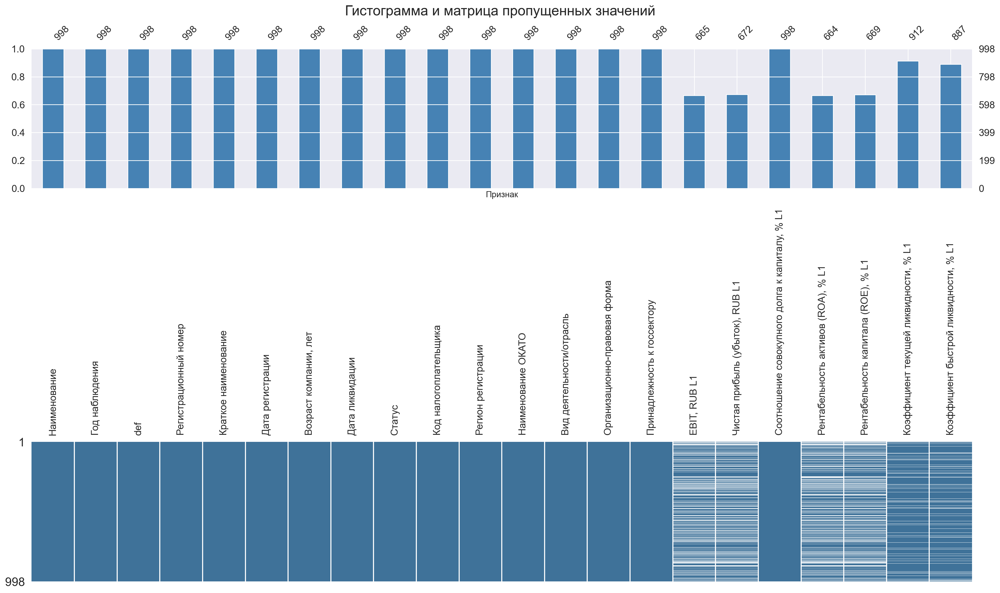

In [11]:
fig, axes = plt.subplots(2, 1, figsize=(20, 12))
plt.suptitle("Гистограмма и матрица пропущенных значений", fontsize=20)

msno.bar(
    likvid,
    ax=axes[0],
    color="steelblue",
    fontsize=14,
    labels=True,
)
axes[0].tick_params(axis='x', which='both', bottom=False, labelbottom=False) 

msno.matrix(
    likvid,
    ax=axes[1],
    color=(0.25, 0.45, 0.6),
    fontsize=14,
)
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=90, ha='center')
plt.tight_layout()


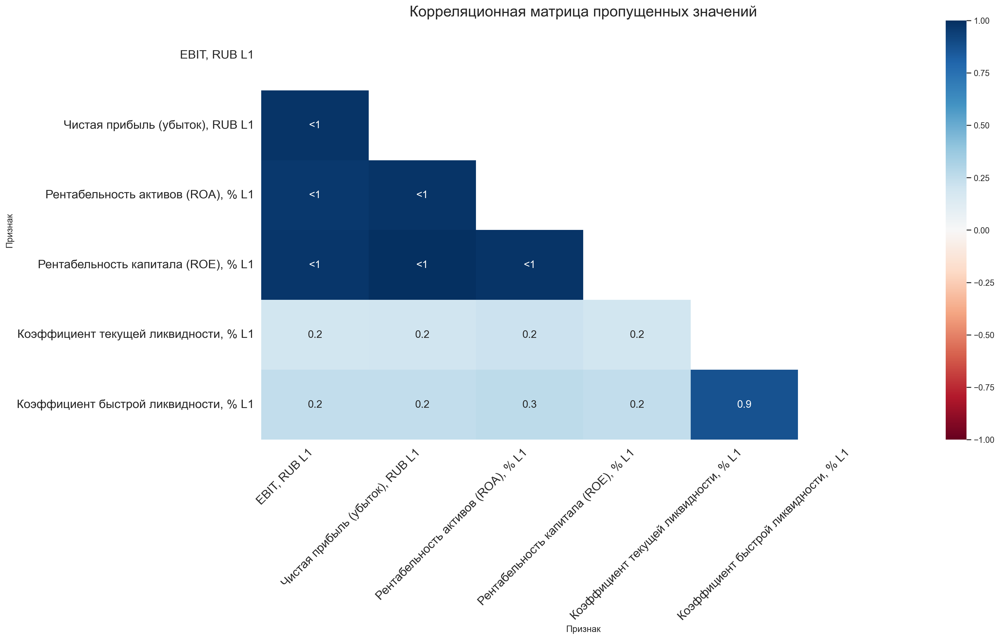

In [12]:
msno.heatmap(likvid)
plt.title("Корреляционная матрица пропущенных значений", fontsize=20)
plt.tight_layout()

In [13]:
likvid = likvid[~((likvid["EBIT, RUB L1"].isna()) &
                  (likvid["Чистая прибыль (убыток), RUB L1"].isna()) &
                  (likvid["Рентабельность активов (ROA), % L1"].isna()) &
                  (likvid["Рентабельность капитала (ROE), % L1"].isna()))]
likvid.shape

(673, 22)

In [14]:
likvid.isna().sum()

Признак
Наименование                                       0
Год наблюдения                                     0
def                                                0
Регистрационный номер                              0
Краткое наименование                               0
Дата регистрации                                   0
Возраст компании, лет                              0
Дата ликвидации                                    0
Статус                                             0
Код налогоплательщика                              0
Регион регистрации                                 0
Наименование ОКАТО                                 0
Вид деятельности/отрасль                           0
Организационно-правовая форма                      0
Принадлежность к госсектору                        0
EBIT, RUB L1                                       8
Чистая прибыль (убыток), RUB L1                    1
Соотношение совокупного долга к капиталу, % L1     0
Рентабельность активов (ROA), % L1    

In [15]:
nans = [
       'EBIT, RUB L1', 'Чистая прибыль (убыток), RUB L1', 'Рентабельность активов (ROA), % L1',
       'Рентабельность капитала (ROE), % L1', 'Коэффициент текущей ликвидности, % L1', 'Коэффициент быстрой ликвидности, % L1',
]

imputer = KNNImputer(n_neighbors=10, weights='distance')
imputed_array = imputer.fit_transform(likvid[nans])

imputed_part = pd.DataFrame(
    imputed_array,
    columns=nans,
    index=likvid.index
)

likvid[nans] = likvid[nans].fillna(imputed_part)

In [16]:
likvid.isna().sum()

Признак
Наименование                                      0
Год наблюдения                                    0
def                                               0
Регистрационный номер                             0
Краткое наименование                              0
Дата регистрации                                  0
Возраст компании, лет                             0
Дата ликвидации                                   0
Статус                                            0
Код налогоплательщика                             0
Регион регистрации                                0
Наименование ОКАТО                                0
Вид деятельности/отрасль                          0
Организационно-правовая форма                     0
Принадлежность к госсектору                       0
EBIT, RUB L1                                      0
Чистая прибыль (убыток), RUB L1                   0
Соотношение совокупного долга к капиталу, % L1    0
Рентабельность активов (ROA), % L1                0
Рент

#### 1.2 Действующие компании

In [26]:
df = pd.read_excel("действ.xlsx")
df.columns = df.iloc[2]
df = df.iloc[3:10003, 1:]
df.head(5)

normal = melting(df)
normal["def"] = 0
normal

Признак,Наименование,Регистрационный номер,Краткое наименование,Дата регистрации,"Возраст компании, лет",Дата ликвидации,Статус,Код налогоплательщика,Регион регистрации,Наименование ОКАТО,...,"Проценты к уплате, RUB","Рентабельность активов (ROA), %","Рентабельность капитала (ROE), %","Собственный капитал, RUB","Соотношение совокупного долга к EBIT, %","Соотношение совокупного долга к капиталу, %","Чистая прибыль (убыток), RUB","Чистые активы, RUB",Год наблюдения,def
0,"101 ГОРОДОК, ООО",1156196067390,"ООО ""101 ГОРОДОК""",2015-11-05,10,NaT,Действующая,6154141482,Ростовская область,"Ростовская область, Таганрог",...,NaN,0.064,0.3249,300000,NaN,0.6667,232000,300000,2020,0
1,"101 ГОРОДОК, ООО",1156196067390,"ООО ""101 ГОРОДОК""",2015-11-05,10,NaT,Действующая,6154141482,Ростовская область,"Ростовская область, Таганрог",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2021,0
2,"101 ГОРОДОК, ООО",1156196067390,"ООО ""101 ГОРОДОК""",2015-11-05,10,NaT,Действующая,6154141482,Ростовская область,"Ростовская область, Таганрог",...,NaN,-0.0397,-0.5736,184000,NaN,NaN,-148000,184000,2022,0
3,"101 ГОРОДОК, ООО",1156196067390,"ООО ""101 ГОРОДОК""",2015-11-05,10,NaT,Действующая,6154141482,Ростовская область,"Ростовская область, Таганрог",...,NaN,0.0104,0.2065,184000,NaN,NaN,38000,184000,2023,0
4,"101 ГОРОДОК, ООО",1156196067390,"ООО ""101 ГОРОДОК""",2015-11-05,10,NaT,Действующая,6154141482,Ростовская область,"Ростовская область, Таганрог",...,NaN,0.0076,0.132,210000,NaN,NaN,26000,210000,2024,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,"ЯРУС, ООО",1067105009861,"ООО ""ЯРУС""",2006-10-10,19,NaT,Действующая,7105038396,Тульская область,"Тульская область, Тула, Пролетарский",...,6450000,-0.1093,-1.0367,9647000,-7.9302,15.2596,-20763000,9647000,2020,0
49996,"ЯРУС, ООО",1067105009861,"ООО ""ЯРУС""",2006-10-10,19,NaT,Действующая,7105038396,Тульская область,"Тульская область, Тула, Пролетарский",...,3989000,-0.1298,8.2037,-15852000,-6.6303,-11.1572,-25452000,-15852000,2021,0
49997,"ЯРУС, ООО",1067105009861,"ООО ""ЯРУС""",2006-10-10,19,NaT,Действующая,7105038396,Тульская область,"Тульская область, Тула, Пролетарский",...,4690000,0.0432,0.7237,19148000,38.7522,9.4917,10086000,19148000,2022,0
49998,"ЯРУС, ООО",1067105009861,"ООО ""ЯРУС""",2006-10-10,19,NaT,Действующая,7105038396,Тульская область,"Тульская область, Тула, Пролетарский",...,5229000,-0.0951,-3.1496,-4275000,-30.2668,-38.4299,-23422000,-4275000,2023,0


In [27]:
non_lag_cols = ['Наименование', 'Год наблюдения', 'def',
    'Регистрационный номер', 'Краткое наименование','Дата регистрации',
    'Возраст компании, лет', 'Дата ликвидации', 'Статус',
    'Код налогоплательщика', 'Регион регистрации', 'Наименование ОКАТО',
    'Вид деятельности/отрасль', 'Организационно-правовая форма', 'Принадлежность к госсектору']

financial_cols = [c for c in normal.columns if c not in non_lag_cols]
for col in financial_cols:
    normal[f"{col} L1"] = normal.groupby("Регистрационный номер")[col].shift(1)
lag1_cols = [c for c in normal.columns if c.endswith("L1")]
normal = normal[non_lag_cols + lag1_cols]
normal = normal.dropna(subset=lag1_cols, how="all")
for col in lag1_cols:
    normal[col] = normal[col].astype(float)
normal

Признак,Наименование,Год наблюдения,def,Регистрационный номер,Краткое наименование,Дата регистрации,"Возраст компании, лет",Дата ликвидации,Статус,Код налогоплательщика,...,"Основные средства , RUB L1","Проценты к получению, RUB L1","Проценты к уплате, RUB L1","Рентабельность активов (ROA), % L1","Рентабельность капитала (ROE), % L1","Собственный капитал, RUB L1","Соотношение совокупного долга к EBIT, % L1","Соотношение совокупного долга к капиталу, % L1","Чистая прибыль (убыток), RUB L1","Чистые активы, RUB L1"
1,"101 ГОРОДОК, ООО",2021,0,1156196067390,"ООО ""101 ГОРОДОК""",2015-11-05,10,NaT,Действующая,6154141482,...,585000.0,NaN,NaN,0.0640,0.3249,300000.0,NaN,0.6667,232000.0,300000.0
3,"101 ГОРОДОК, ООО",2023,0,1156196067390,"ООО ""101 ГОРОДОК""",2015-11-05,10,NaT,Действующая,6154141482,...,68000.0,NaN,NaN,-0.0397,-0.5736,184000.0,NaN,NaN,-148000.0,184000.0
4,"101 ГОРОДОК, ООО",2024,0,1156196067390,"ООО ""101 ГОРОДОК""",2015-11-05,10,NaT,Действующая,6154141482,...,13000.0,NaN,NaN,0.0104,0.2065,184000.0,NaN,NaN,38000.0,184000.0
11,"116, ООО",2021,0,1084101001126,"ООО ""116""",2008-03-03,17,NaT,Действующая,4101122355,...,31000.0,NaN,NaN,0.0662,0.0789,18511000.0,NaN,NaN,1415000.0,18511000.0
12,"116, ООО",2022,0,1084101001126,"ООО ""116""",2008-03-03,17,NaT,Действующая,4101122355,...,20000.0,NaN,NaN,0.0548,0.0974,20012000.0,NaN,NaN,1876000.0,20012000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49994,"ЯРТОКАРЬ, ООО",2024,0,1137602007278,"ООО ""ЯРТОКАРЬ""",2013-12-02,12,NaT,Действующая,7602102323,...,9146000.0,NaN,41000.0,0.3980,0.6884,6502000.0,23.3171,0.1470,4046000.0,6502000.0
49996,"ЯРУС, ООО",2021,0,1067105009861,"ООО ""ЯРУС""",2006-10-10,19,NaT,Действующая,7105038396,...,72455000.0,NaN,6450000.0,-0.1093,-1.0367,9647000.0,-7.9302,15.2596,-20763000.0,9647000.0
49997,"ЯРУС, ООО",2022,0,1067105009861,"ООО ""ЯРУС""",2006-10-10,19,NaT,Действующая,7105038396,...,66514000.0,NaN,3989000.0,-0.1298,8.2037,-15852000.0,-6.6303,-11.1572,-25452000.0,-15852000.0
49998,"ЯРУС, ООО",2023,0,1067105009861,"ООО ""ЯРУС""",2006-10-10,19,NaT,Действующая,7105038396,...,113396000.0,NaN,4690000.0,0.0432,0.7237,19148000.0,38.7522,9.4917,10086000.0,19148000.0


In [28]:
normal[(normal['Заёмные средства (долгосрочные), RUB L1'] + normal['Заёмные средства (краткосрочные), RUB L1'] > 0) |
        (normal['Заёмные средства (долгосрочные), RUB L1'].isna()) | (normal['Заёмные средства (краткосрочные), RUB L1'].isna())]
normal.loc[normal["Соотношение совокупного долга к капиталу, % L1"] < 0, 
           "Соотношение совокупного долга к капиталу, % L1"] = 10 + normal.loc[normal["Соотношение совокупного долга к капиталу, % L1"] < 0, "Соотношение совокупного долга к капиталу, % L1"].abs()

normal.loc[(normal['Собственный капитал, RUB L1'] < 0) & (normal['Чистая прибыль (убыток), RUB L1'] < 0), 
           'Рентабельность капитала (ROE), % L1'] = -1 * normal.loc[(normal['Собственный капитал, RUB L1'] < 0) & (normal['Чистая прибыль (убыток), RUB L1'] < 0), 'Рентабельность капитала (ROE), % L1'] - 10
normal.loc[(normal['Внеоборотные активы, RUB L1'] + normal['Оборотные активы, RUB L1'] < 0) & (normal['Чистая прибыль (убыток), RUB L1'] < 0), 
           'Рентабельность активов (ROA), % L1'] = -1 * normal.loc[(normal['Внеоборотные активы, RUB L1'] + normal['Оборотные активы, RUB L1'] < 0) & (normal['Чистая прибыль (убыток), RUB L1'] < 0), 'Рентабельность активов (ROA), % L1'] - 10

normal = normal[non_lag_cols + ['EBIT, RUB L1', 'Чистая прибыль (убыток), RUB L1', 'Соотношение совокупного долга к капиталу, % L1',
                                'Рентабельность активов (ROA), % L1', 'Рентабельность капитала (ROE), % L1', "Коэффициент текущей ликвидности, % L1", "Коэффициент быстрой ликвидности, % L1"]]
normal.head(5)

Признак,Наименование,Год наблюдения,def,Регистрационный номер,Краткое наименование,Дата регистрации,"Возраст компании, лет",Дата ликвидации,Статус,Код налогоплательщика,...,Вид деятельности/отрасль,Организационно-правовая форма,Принадлежность к госсектору,"EBIT, RUB L1","Чистая прибыль (убыток), RUB L1","Соотношение совокупного долга к капиталу, % L1","Рентабельность активов (ROA), % L1","Рентабельность капитала (ROE), % L1","Коэффициент текущей ликвидности, % L1","Коэффициент быстрой ликвидности, % L1"
1,"101 ГОРОДОК, ООО",2021,0,1156196067390,"ООО ""101 ГОРОДОК""",2015-11-05,10,NaT,Действующая,6154141482,...,"Производство прочих металлических цистерн, рез...",12300 - Общества с ограниченной ответственностью,NaN,290000.0,232000.0,0.6667,0.0640,0.3249,0.9719,0.2287
3,"101 ГОРОДОК, ООО",2023,0,1156196067390,"ООО ""101 ГОРОДОК""",2015-11-05,10,NaT,Действующая,6154141482,...,"Производство прочих металлических цистерн, рез...",12300 - Общества с ограниченной ответственностью,NaN,-148000.0,-148000.0,NaN,-0.0397,-0.5736,1.0335,0.1203
4,"101 ГОРОДОК, ООО",2024,0,1156196067390,"ООО ""101 ГОРОДОК""",2015-11-05,10,NaT,Действующая,6154141482,...,"Производство прочих металлических цистерн, рез...",12300 - Общества с ограниченной ответственностью,NaN,38000.0,38000.0,NaN,0.0104,0.2065,1.0496,0.1252
11,"116, ООО",2021,0,1084101001126,"ООО ""116""",2008-03-03,17,NaT,Действующая,4101122355,...,Производство строительных металлических констр...,12300 - Общества с ограниченной ответственностью,NaN,1415000.0,1415000.0,NaN,0.0662,0.0789,4.8324,4.6109
12,"116, ООО",2022,0,1084101001126,"ООО ""116""",2008-03-03,17,NaT,Действующая,4101122355,...,Производство строительных металлических констр...,12300 - Общества с ограниченной ответственностью,NaN,1876000.0,1876000.0,NaN,0.0548,0.0974,2.3220,2.3220


In [29]:
normal["Принадлежность к госсектору"] = normal["Принадлежность к госсектору"].replace({np.nan: 'нет'})
normal["Дата ликвидации"] = normal["Дата ликвидации"].fillna('-')

C:\Users\Admin\AppData\Local\Temp\ipykernel_134832\1924286069.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  normal["Принадлежность к госсектору"] = normal["Принадлежность к госсектору"].replace({np.nan: 'нет'})
C:\Users\Admin\AppData\Local\Temp\ipykernel_134832\1924286069.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  normal["Дата ликвидации"] = normal["Дата ликвидации"].fillna('-')


In [30]:
normal.isna().sum()

Признак
Наименование                                          0
Год наблюдения                                        0
def                                                   0
Регистрационный номер                                 0
Краткое наименование                                  0
Дата регистрации                                      0
Возраст компании, лет                                 0
Дата ликвидации                                       0
Статус                                                0
Код налогоплательщика                                 0
Регион регистрации                                    0
Наименование ОКАТО                                    0
Вид деятельности/отрасль                              0
Организационно-правовая форма                         0
Принадлежность к госсектору                           0
EBIT, RUB L1                                       3346
Чистая прибыль (убыток), RUB L1                    3364
Соотношение совокупного долга к капиталу

In [31]:
normal = normal.dropna()
normal.shape

(17215, 22)

#### 1.4 Макрофакторы.

В качестве макроэкономических риск-факторов были отобраны среднегодовой PMI производственного сектора (парсинг Cbonds), среднегодовой курс USD/RUB (парсинг ЦБ), средние процентные ставки по кредитам до 1 года для обрабатывающего сектора (отчет ЦБ), общий объем кредитования ОКВЭД 24-25 (отчет ЦБ).

In [33]:
def make_pmi() -> pd.Series:
    START = dt.date(2020, 1, 1)
    END = dt.date(2024, 12, 1)

    PMI = {}
    for day in tqdm(pd.date_range(START, END, freq="ME"), desc="Собираю PMI"):
        try:
            responce = requests.get(f"https://cbonds.ru/api/indexes/51339/{str(day)[:-9]}/getValue/").json()["CbondsIndexValue.numeric"]
            PMI[day] = responce
        except TypeError:
            continue
    
    s = pd.DataFrame(list(PMI.items()), columns=['period', 'pmi'])
    s["year"] = s["period"].dt.year
    s = s.groupby("year", as_index=False)["pmi"].mean()
    return s


def make_ex():
    params = {"date_req1": f"01/01/2020", "date_req2": f"31/12/2024", "VAL_NM_RQ": "R01235"}
    while True:
        try:
            r = requests.get("https://www.cbr.ru/scripts/XML_dynamic.asp", params=params, timeout=30)
            r.raise_for_status()
            break
        except requests.ConnectionError:
            continue

    root = ET.fromstring(r.content)
    rows = []
    for rec in root.findall("Record"):
        d = rec.attrib["Date"]
        v = rec.find("Value").text.replace(",", ".")
        rows.append((pd.to_datetime(d, dayfirst=True), float(v)))
    
    df = pd.DataFrame(rows, columns=["year", "USD"]).set_index("year")
    df = df.resample("YE").mean().round(4)
    df.index = df.index.year
    
    result = df.reset_index().rename(columns={"index":"period"})
    return result

In [34]:
pmi = make_pmi()
usd = make_ex()
macro = pd.merge(pmi, usd, on="year", how="inner")
macro

Собираю PMI: 100%|██████████| 59/59 [00:12<00:00,  4.84it/s]


,year,pmi,USD
0,2020,45.983333,72.3230
1,2021,50.308333,73.6685
2,2022,50.441667,68.3522
3,2023,53.300000,85.8116
4,2024,53.045455,92.6567


Cредние процентные ставки по кредитам до 1 года для обрабатывающего сектора (отчет ЦБ)

In [35]:
interest = pd.read_excel("loans_nonfin_by_activity.xlsx")
interest.columns = interest.iloc[4]
interest = interest[interest["Вид деятельности заемщика"].str[0] == "C"].iloc[:1, 1:]
interest = pd.melt(interest).loc[1:]
interest[4] = interest[4].str[-4:].astype(int)
interest["value"] = interest["value"].astype(float)
interest = interest.groupby(4, as_index=False)["value"].mean()
interest = interest.rename(columns={4: "year", "value": "interest"})
interest

,year,interest
0,2019,8.453333
1,2020,6.287500
2,2021,6.488333
3,2022,10.943333
4,2023,10.355833
5,2024,17.888333
6,2025,19.511111


Общий объем кредитования ОКВЭД 24-25 (отчет ЦБ)

In [36]:
credits = pd.read_excel("01_01_C_New_loans_corp_by_activity.xlsx")
credits.columns = credits.loc[0]
credits = credits[credits["Класс ОКВЭД2"].str[:2].isin(["24", "25"])]
credits = pd.melt(credits, id_vars="Класс ОКВЭД2")
credits[0] = credits[0].str[-4:].astype(int)
credits["value"] = credits["value"].astype(float)
credits = credits.groupby(['Класс ОКВЭД2', 0], as_index=False)["value"].mean()
credits = credits.groupby(0, as_index=False)["value"].sum()
credits = credits.rename(columns={0: "year", "value": "credits"})
credits

,year,credits
0,2018,104619.333333
1,2019,109207.750000
2,2020,103718.666667
3,2021,94446.500000
4,2022,192980.000000
5,2023,249407.583333
6,2024,281393.750000
7,2025,278888.777778


In [37]:
macro = pd.merge(macro, interest, on="year", how="inner")
macro = pd.merge(macro, credits, on="year", how="inner")
macro

,year,pmi,USD,interest,credits
0,2020,45.983333,72.3230,6.287500,103718.666667
1,2021,50.308333,73.6685,6.488333,94446.500000
2,2022,50.441667,68.3522,10.943333,192980.000000
3,2023,53.300000,85.8116,10.355833,249407.583333
4,2024,53.045455,92.6567,17.888333,281393.750000


Также посчитаем лаги.

In [38]:
for col in macro.columns:
    macro[f"{col} L1"] = macro[col].shift(1)
macro = macro[['year', 'pmi L1', 'USD L1', 'interest L1', 'credits L1']]
macro = macro.dropna()
macro = macro.rename(columns={"year": "Год наблюдения"})
macro 

,Год наблюдения,pmi L1,USD L1,interest L1,credits L1
1,2021,45.983333,72.3230,6.287500,103718.666667
2,2022,50.308333,73.6685,6.488333,94446.500000
3,2023,50.441667,68.3522,10.943333,192980.000000
4,2024,53.300000,85.8116,10.355833,249407.583333


#### 1.4 Соединяем датасеты и финально обрабатываем.

In [39]:
main = pd.concat([normal, likvid])
main = pd.merge(main, macro, on="Год наблюдения", how="inner")
main

,Наименование,Год наблюдения,def,Регистрационный номер,Краткое наименование,Дата регистрации,"Возраст компании, лет",Дата ликвидации,Статус,Код налогоплательщика,...,"Чистая прибыль (убыток), RUB L1","Соотношение совокупного долга к капиталу, % L1","Рентабельность активов (ROA), % L1","Рентабельность капитала (ROE), % L1","Коэффициент текущей ликвидности, % L1","Коэффициент быстрой ликвидности, % L1",pmi L1,USD L1,interest L1,credits L1
0,"101 ГОРОДОК, ООО",2021,0,1156196067390,"ООО ""101 ГОРОДОК""",2015-11-05,10,-,Действующая,6154141482,...,232000.0,0.6667,0.0640,0.3249,0.9719,0.2287,45.983333,72.3230,6.287500,103718.666667
1,"2 В, ООО",2021,0,1045206690198,"ООО ""2 В""",2004-06-25,21,-,Действующая,5246025607,...,-172000.0,2.0455,-0.3543,-0.7167,1.3116,1.1870,45.983333,72.3230,6.287500,103718.666667
2,"20 ТОНН, ООО",2021,0,1137456005906,"ООО ""20 ТОНН""",2013-09-12,12,-,Действующая,7455014465,...,111000.0,0.2457,0.0485,0.1360,1.5026,0.7018,45.983333,72.3230,6.287500,103718.666667
3,"20 ТОНН, ООО",2022,0,1137456005906,"ООО ""20 ТОНН""",2013-09-12,12,-,Действующая,7455014465,...,133000.0,0.2595,0.0349,0.1420,1.2754,0.2207,50.308333,73.6685,6.488333,94446.500000
4,"20 ТОНН, ООО",2023,0,1137456005906,"ООО ""20 ТОНН""",2013-09-12,12,-,Действующая,7455014465,...,309000.0,0.1016,0.0613,0.2586,1.4733,0.3054,50.441667,68.3522,10.943333,192980.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17879,"ЮГ-МАРКЕТ, ООО",2022,1,1186196033330,"ООО ""ЮГ-МАРКЕТ""",2018-08-08,7,2023-11-03 00:00:00,Недействующая,6154153030,...,275000.0,11.5100,0.0160,2.5000,1.1116,0.4363,50.308333,73.6685,6.488333,94446.500000
17880,"ЮГ-ПРОМ, ООО",2023,1,1182375116395,"ООО ""ЮГ-ПРОМ""",2018-12-14,6,2024-07-12 00:00:00,Недействующая,2312278380,...,-18000.0,13.8393,-0.0081,-0.2769,1.0218,0.8342,50.441667,68.3522,10.943333,192980.000000
17881,"ЮНИКО МЕТАЛЛ, ООО",2024,1,1055404078950,"ООО ""ЮНИКО МЕТАЛЛ""",2005-05-31,20,2025-04-23 00:00:00,Недействующая,5404248574,...,-239388000.0,10.0666,-1.7856,-13.8170,0.0207,0.0180,53.300000,85.8116,10.355833,249407.583333
17882,"ЮНИПРОМ, ООО",2023,1,5067847432791,"ООО ""ЮНИПРОМ""",2006-10-11,19,2024-07-18 00:00:00,Недействующая,7810075744,...,-14000.0,1.6224,-0.0094,-0.0266,1.5672,0.5322,50.441667,68.3522,10.943333,192980.000000


In [40]:
main = main[['Год наблюдения', 'Краткое наименование', 'Регистрационный номер', 'Возраст компании, лет', 'Регион регистрации',
             'Вид деятельности/отрасль', 'Организационно-правовая форма', 'Принадлежность к госсектору',
             'EBIT, RUB L1', 'Чистая прибыль (убыток), RUB L1', 'Соотношение совокупного долга к капиталу, % L1',
             'Рентабельность активов (ROA), % L1', 'Рентабельность капитала (ROE), % L1', 'Коэффициент текущей ликвидности, % L1',
             'Коэффициент быстрой ликвидности, % L1', 'pmi L1', 'USD L1', 'interest L1', 'credits L1', 'def']]
main.head(5)

,Год наблюдения,Краткое наименование,Регистрационный номер,"Возраст компании, лет",Регион регистрации,Вид деятельности/отрасль,Организационно-правовая форма,Принадлежность к госсектору,"EBIT, RUB L1","Чистая прибыль (убыток), RUB L1","Соотношение совокупного долга к капиталу, % L1","Рентабельность активов (ROA), % L1","Рентабельность капитала (ROE), % L1","Коэффициент текущей ликвидности, % L1","Коэффициент быстрой ликвидности, % L1",pmi L1,USD L1,interest L1,credits L1,def
0,2021,"ООО ""101 ГОРОДОК""",1156196067390,10,Ростовская область,"Производство прочих металлических цистерн, рез...",12300 - Общества с ограниченной ответственностью,нет,290000.0,232000.0,0.6667,0.0640,0.3249,0.9719,0.2287,45.983333,72.3230,6.287500,103718.666667,0
1,2021,"ООО ""2 В""",1045206690198,21,Нижегородская область,Обработка металлов и нанесение покрытий на мет...,12300 - Общества с ограниченной ответственностью,нет,-136000.0,-172000.0,2.0455,-0.3543,-0.7167,1.3116,1.1870,45.983333,72.3230,6.287500,103718.666667,0
2,2021,"ООО ""20 ТОНН""",1137456005906,12,Челябинская область,Обработка металлических изделий механическая,12300 - Общества с ограниченной ответственностью,нет,138000.0,111000.0,0.2457,0.0485,0.1360,1.5026,0.7018,45.983333,72.3230,6.287500,103718.666667,0
3,2022,"ООО ""20 ТОНН""",1137456005906,12,Челябинская область,Обработка металлических изделий механическая,12300 - Общества с ограниченной ответственностью,нет,171000.0,133000.0,0.2595,0.0349,0.1420,1.2754,0.2207,50.308333,73.6685,6.488333,94446.500000,0
4,2023,"ООО ""20 ТОНН""",1137456005906,12,Челябинская область,Обработка металлических изделий механическая,12300 - Общества с ограниченной ответственностью,нет,386000.0,309000.0,0.1016,0.0613,0.2586,1.4733,0.3054,50.441667,68.3522,10.943333,192980.000000,0


In [41]:
main["Организационно-правовая форма"] = main["Организационно-правовая форма"].replace({
       '12300 - Общества с ограниченной ответственностью': "ООО",
       '12267 - Непубличные акционерные общества': "АО",
       '30002 - Филиалы юридических лиц': "ФЮЛ",
       '12247 - Публичные акционерные общества': "ПАО",
       '14200 - Производственные кооперативы (кроме сельскохозяйственных производственных кооперативов)': "ПК"})

main = main.rename(columns={'Год наблюдения': "year", 'Краткое наименование': "name", 'Регистрационный номер': "inn",
       'Возраст компании, лет': "age", 'Регион регистрации': "region",
       'Вид деятельности/отрасль': "ttype", 'Организационно-правовая форма': "form",
       'Принадлежность к госсектору': "is_gov", 'EBIT, RUB L1': "EBIT_L1",
       'Чистая прибыль (убыток), RUB L1': "net_profit_L1",
       'Соотношение совокупного долга к капиталу, % L1': "debt_equity_L1",
       'Рентабельность активов (ROA), % L1': "ROA_L1",
       'Рентабельность капитала (ROE), % L1': "ROE_L1",
       'Коэффициент текущей ликвидности, % L1': "current_liq_L1",
       'Коэффициент быстрой ликвидности, % L1': "quick_liq_L1", 'pmi L1': "PMI_L1", 'USD L1': "usd_L1",
       'interest L1': "interest_L1", 'credits L1': "credits_L1"})
main.head(5)

C:\Users\Admin\AppData\Local\Temp\ipykernel_134832\2265774886.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  main["Организационно-правовая форма"] = main["Организационно-правовая форма"].replace({


,year,name,inn,age,region,ttype,form,is_gov,EBIT_L1,net_profit_L1,debt_equity_L1,ROA_L1,ROE_L1,current_liq_L1,quick_liq_L1,PMI_L1,usd_L1,interest_L1,credits_L1,def
0,2021,"ООО ""101 ГОРОДОК""",1156196067390,10,Ростовская область,"Производство прочих металлических цистерн, рез...",ООО,нет,290000.0,232000.0,0.6667,0.0640,0.3249,0.9719,0.2287,45.983333,72.3230,6.287500,103718.666667,0
1,2021,"ООО ""2 В""",1045206690198,21,Нижегородская область,Обработка металлов и нанесение покрытий на мет...,ООО,нет,-136000.0,-172000.0,2.0455,-0.3543,-0.7167,1.3116,1.1870,45.983333,72.3230,6.287500,103718.666667,0
2,2021,"ООО ""20 ТОНН""",1137456005906,12,Челябинская область,Обработка металлических изделий механическая,ООО,нет,138000.0,111000.0,0.2457,0.0485,0.1360,1.5026,0.7018,45.983333,72.3230,6.287500,103718.666667,0
3,2022,"ООО ""20 ТОНН""",1137456005906,12,Челябинская область,Обработка металлических изделий механическая,ООО,нет,171000.0,133000.0,0.2595,0.0349,0.1420,1.2754,0.2207,50.308333,73.6685,6.488333,94446.500000,0
4,2023,"ООО ""20 ТОНН""",1137456005906,12,Челябинская область,Обработка металлических изделий механическая,ООО,нет,386000.0,309000.0,0.1016,0.0613,0.2586,1.4733,0.3054,50.441667,68.3522,10.943333,192980.000000,0


Сохраним промежуточные результаты.

In [42]:
main

,year,name,inn,age,region,ttype,form,is_gov,EBIT_L1,net_profit_L1,debt_equity_L1,ROA_L1,ROE_L1,current_liq_L1,quick_liq_L1,PMI_L1,usd_L1,interest_L1,credits_L1,def
0,2021,"ООО ""101 ГОРОДОК""",1156196067390,10,Ростовская область,"Производство прочих металлических цистерн, рез...",ООО,нет,290000.0,232000.0,0.6667,0.0640,0.3249,0.9719,0.2287,45.983333,72.3230,6.287500,103718.666667,0
1,2021,"ООО ""2 В""",1045206690198,21,Нижегородская область,Обработка металлов и нанесение покрытий на мет...,ООО,нет,-136000.0,-172000.0,2.0455,-0.3543,-0.7167,1.3116,1.1870,45.983333,72.3230,6.287500,103718.666667,0
2,2021,"ООО ""20 ТОНН""",1137456005906,12,Челябинская область,Обработка металлических изделий механическая,ООО,нет,138000.0,111000.0,0.2457,0.0485,0.1360,1.5026,0.7018,45.983333,72.3230,6.287500,103718.666667,0
3,2022,"ООО ""20 ТОНН""",1137456005906,12,Челябинская область,Обработка металлических изделий механическая,ООО,нет,171000.0,133000.0,0.2595,0.0349,0.1420,1.2754,0.2207,50.308333,73.6685,6.488333,94446.500000,0
4,2023,"ООО ""20 ТОНН""",1137456005906,12,Челябинская область,Обработка металлических изделий механическая,ООО,нет,386000.0,309000.0,0.1016,0.0613,0.2586,1.4733,0.3054,50.441667,68.3522,10.943333,192980.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17879,2022,"ООО ""ЮГ-МАРКЕТ""",1186196033330,7,Ростовская область,Производство строительных металлических констр...,ООО,нет,394000.0,275000.0,11.5100,0.0160,2.5000,1.1116,0.4363,50.308333,73.6685,6.488333,94446.500000,1
17880,2023,"ООО ""ЮГ-ПРОМ""",1182375116395,6,Краснодарский край,"Производство изделий из проволоки, цепей и пружин",ООО,нет,-18000.0,-18000.0,13.8393,-0.0081,-0.2769,1.0218,0.8342,50.441667,68.3522,10.943333,192980.000000,1
17881,2024,"ООО ""ЮНИКО МЕТАЛЛ""",1055404078950,20,Новосибирская область,Производство прочих готовых металлических изде...,ООО,нет,-238211000.0,-239388000.0,10.0666,-1.7856,-13.8170,0.0207,0.0180,53.300000,85.8116,10.355833,249407.583333,1
17882,2023,"ООО ""ЮНИПРОМ""",5067847432791,19,Ленинградская область,Производство металлических дверей и окон,ООО,нет,-13000.0,-14000.0,1.6224,-0.0094,-0.0266,1.5672,0.5322,50.441667,68.3522,10.943333,192980.000000,1


In [43]:
main.to_excel("reading_data.xlsx", index=False)

### 2. EDA.

In [36]:
main = pd.read_excel("reading_data.xlsx")

#### 2.1 Распределения 

Посмотрим на итоговое распределение целевой переменной.

def
0    17211
1      673
Name: count, dtype: int64

Банкроты составляют 3.76 % выборки


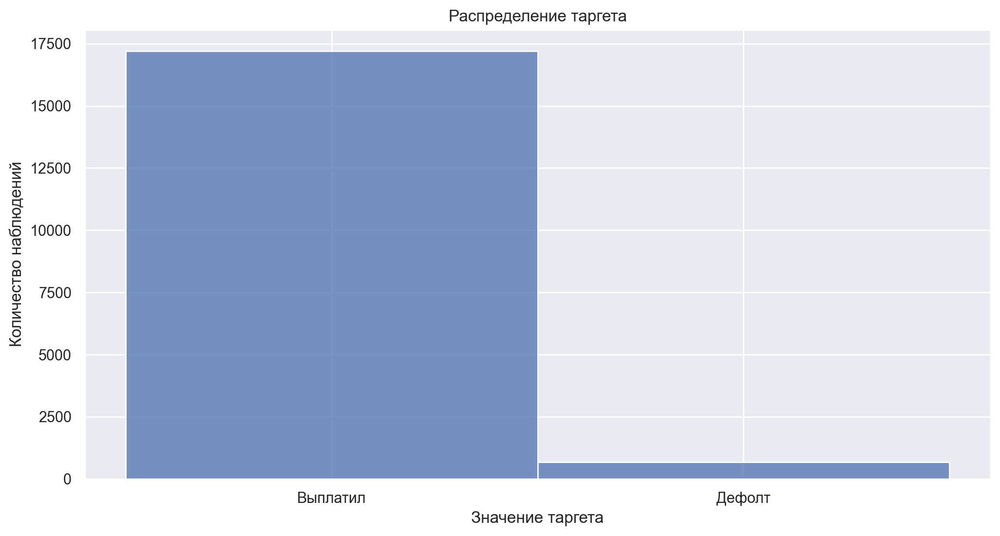

In [44]:
sns.histplot(data=main["def"], discrete=True)
plt.title("Распределение таргета")
plt.xlabel("Значение таргета")
plt.ylabel("Количество наблюдений")
plt.xticks([0, 1], ["Выплатил", "Дефолт"]) 
display(main["def"].value_counts())
print("Банкроты составляют", round(100 * main["def"].mean(), 2), "% выборки")
plt.show()

Ожидаемо наблюдается сильный дисбаланс выборки. Посмотрим, какое будет соотношение после исключения выбросов. Возможно, при обучении придется применить undersampling.

Построим графики распределения числовых признаков.

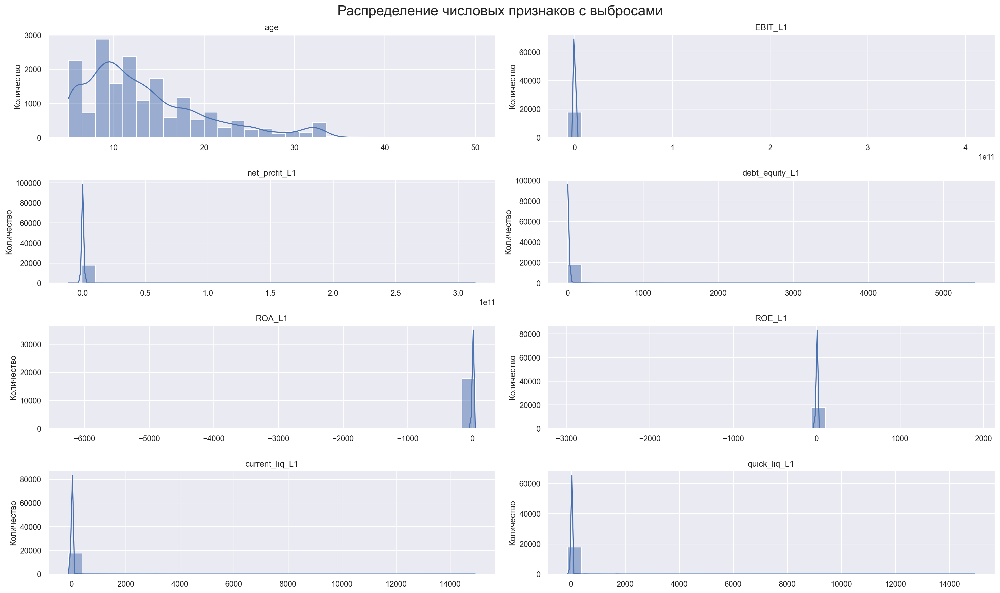

In [45]:
numeric = ['age', 'EBIT_L1', 'net_profit_L1', 'debt_equity_L1', 'ROA_L1',
         'ROE_L1', 'current_liq_L1', 'quick_liq_L1']

fig, axes = plt.subplots(4, 2, figsize=(20, 12))
plt.suptitle('Распределение числовых признаков с выбросами', fontsize=20)

for ax, col in zip(axes.flatten(), numeric):
    sns.histplot(main[col], bins=30, kde=True, ax=ax)
    ax.set_title(col)
    ax.set_xlabel("")
    ax.set_ylabel("Количество")

plt.tight_layout()
plt.show()

Распределения почти всех признаков, кроме возраста компании, имеют сильные хвосты справа или слева. Исключим выбросы с помощью квантилей.

In [46]:
df = main.copy()
df = df[df['EBIT_L1'] <= df['EBIT_L1'].quantile(0.95)]
df = df[df['EBIT_L1'] >= df['EBIT_L1'].quantile(0.01)]

df = df[df['net_profit_L1'] <= df['net_profit_L1'].quantile(0.95)]
df = df[df['net_profit_L1'] >= df['net_profit_L1'].quantile(0.01)]

df = df[df['debt_equity_L1'] <= df['debt_equity_L1'].quantile(0.965)]

df = df[df['ROA_L1'] <= df['ROA_L1'].quantile(0.98)]
df = df[df['ROA_L1'] >= df['ROA_L1'].quantile(0.015)]

df = df[df['ROE_L1'] <= df['ROE_L1'].quantile(0.993)]
df = df[df['ROE_L1'] >= df['ROE_L1'].quantile(0.01)]

df = df[df['quick_liq_L1'] <= df['quick_liq_L1'].quantile(0.98)]
df = df[df['quick_liq_L1'] >= df['quick_liq_L1'].quantile(0.01)]

df = df[df['current_liq_L1'] <= df['current_liq_L1'].quantile(0.98)]
df = df[df['current_liq_L1'] >= df['current_liq_L1'].quantile(0.01)]

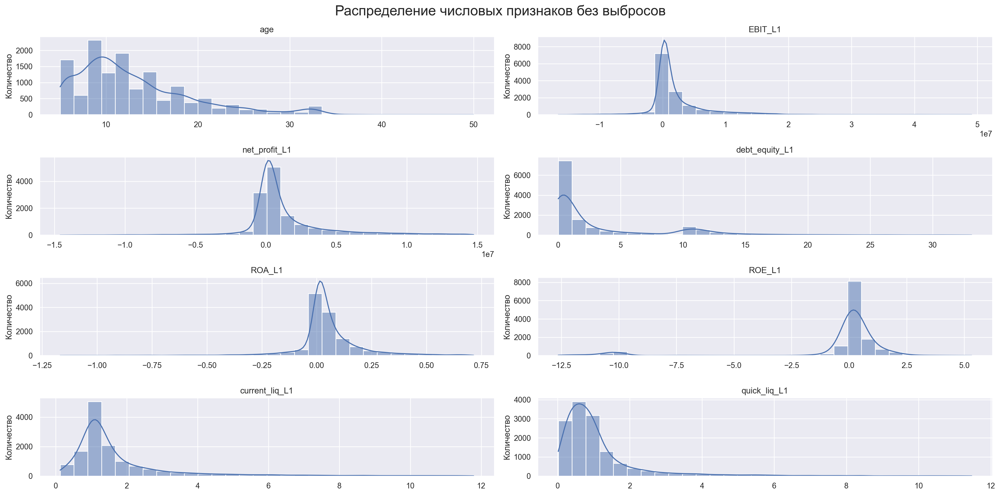

In [47]:
fig, axes = plt.subplots(4, 2, figsize=(20, 10))
plt.suptitle('Распределение числовых признаков без выбросов', fontsize=20)

for ax, col in zip(axes.flatten(), numeric):
    sns.histplot(df[col], bins=30, kde=True, ax=ax)
    ax.set_title(col)
    ax.set_xlabel("")
    ax.set_ylabel("Количество")

plt.tight_layout()
plt.show()

In [48]:
main = df

Мягко отрезали выбросы. Теперь графики распределений выглядят более адекватными.

Теперь поработаем с категориальными признаками. Начнем с признаков с большим количеством уникальных значений.

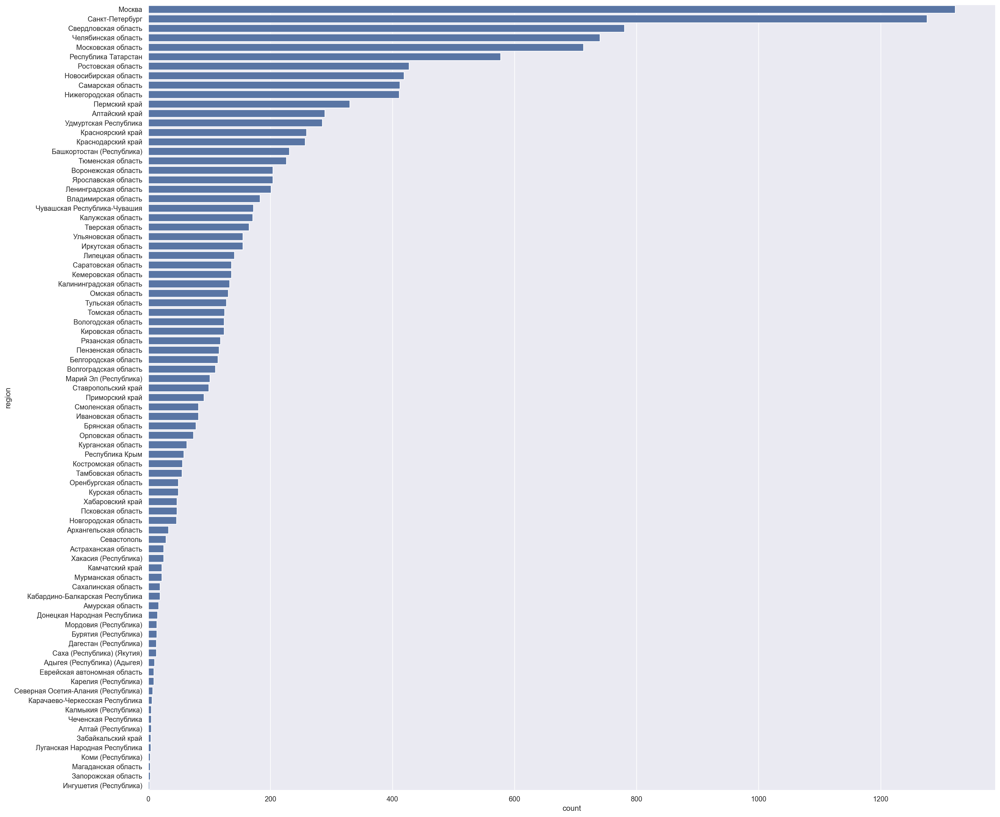

In [49]:
fig, axes = plt.subplots(1, 1, figsize=(22, 18))
sns.countplot(y=main['region'], order=main['region'].value_counts().index)
ax.set_title(col)
ax.set_xlabel("Количество")
ax.set_ylabel("")
plt.tight_layout()
plt.show()

Попробуем закодировать регионы координатами.

In [50]:
regions = list(main.region.unique())
region_coords = pd.DataFrame({"region": regions})
geolocator = Nominatim(user_agent="region_geocoder")
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=0.5)

def get_coords(name: str):
    if pd.isna(name):
        return pd.Series({"lat": None, "lon": None})
    
    query = name
    query_full = f"{query}, Россия"
    
    try:
        location = geocode(query_full)
        if location is None:
            location = geocode(query)
        if location is None:
            return pd.Series({"lat": None, "lon": None})
        return pd.Series({"lat": location.latitude, "lon": location.longitude})
    except Exception:
        return pd.Series({"lat": None, "lon": None})

region_coords[["lat", "lon"]] = region_coords["region"].apply(get_coords)
region_coords.loc[region_coords.region == "Донецкая Народная Республика", "lat"] = 47.985895
region_coords.loc[region_coords.region == "Донецкая Народная Республика", "lon"] = 37.711338
region_coords.loc[region_coords.region == "Луганская Народная Республика", "lat"] = 48.531993
region_coords.loc[region_coords.region == "Луганская Народная Республика", "lon"] = 39.163389
region_coords

,region,lat,lon
0,Ростовская область,47.622245,40.795794
1,Нижегородская область,55.471803,44.091159
2,Челябинская область,54.422395,61.186585
3,Москва,55.625578,37.606392
4,Республика Крым,44.949498,34.100363
...,...,...,...
78,Забайкальский край,52.248521,115.956325
79,Кабардино-Балкарская Республика,43.442829,43.420481
80,Луганская Народная Республика,48.531993,39.163389
81,Мордовия (Республика),54.441983,44.466114


In [51]:
main = pd.merge(main, region_coords, on="region", how="left")

In [52]:
main.isna().sum()

year              0
name              0
inn               0
age               0
region            0
ttype             0
form              0
is_gov            0
EBIT_L1           0
net_profit_L1     0
debt_equity_L1    0
ROA_L1            0
ROE_L1            0
current_liq_L1    0
quick_liq_L1      0
PMI_L1            0
usd_L1            0
interest_L1       0
credits_L1        0
def               0
lat               0
lon               0
dtype: int64

In [53]:
def show_clustered_circles_on_map(
    latitude_values: Iterable[float],
    longitude_values: Iterable[float],
    color: str = "blue"
) -> folium.Map:
    coords = pd.DataFrame({
        'lat': latitude_values,
        'lon': longitude_values
    })

    grouped = coords.groupby(['lat', 'lon']).size().reset_index(name='count')

    location = (coords['lat'].mean(), coords['lon'].mean())
    m = folium.Map(location=location, zoom_start=5)

    for _, row in grouped.iterrows():
        folium.Circle(
            radius=50 + row['count'] * 10,
            location=(row['lat'], row['lon']),
            color=color,
            fill_color=color,
            fill=True,
            popup=f"Точек: {row['count']}"
        ).add_to(m)

    return m

In [54]:
show_clustered_circles_on_map(main.lat, main.lon, color="midnightblue")

In [55]:
# ChatGPT 04-mini-high - все плохо с ООП, да и синтаксис folium особо мне не знаком.
from typing import Iterable
from sklearn.base import BaseEstimator, TransformerMixin

class USMapGridTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, long='state_longitude', lat='state_latitude'):
        self.rows = 4
        self.columns = 5
        self.long = long
        self.lat = lat
        self.borders = (19, 41, 180, 75)
        self.x_min, self.y_min, self.x_max, self.y_max = self.borders
        self.width = (self.x_max - self.x_min) / self.columns
        self.height = (self.y_max - self.y_min) / self.rows

    def _get_cell_number(self, lon, lat):
        col = ((lon - self.x_min) / self.width).astype(int)
        row = ((lat - self.y_min) / self.height).astype(int)
        mask = (col >= 0) & (col < self.columns) & (row >= 0) & (row < self.rows)
        cell = np.where(mask, row * self.columns + col, -1)
        return cell

    def transform(self, df):
        df = df.copy()
        df["grid_cell"] = self._get_cell_number(df[self.long], df[self.lat])
        return df

    def show_map(self, latitude_values: Iterable[float], longitude_values: Iterable[float]):
        location = (np.mean(latitude_values), np.mean(longitude_values))
        m = folium.Map(location=location, zoom_start=4)

        for i in range(self.rows):
            for j in range(self.columns):
                lat_start = self.y_min + i * self.height
                lon_start = self.x_min + j * self.width
                lat_end = lat_start + self.height
                lon_end = lon_start + self.width

                folium.Rectangle(
                    bounds=[(lat_start, lon_start), (lat_end, lon_end)],
                    color="red",
                    weight=1,
                    fill=False
                ).add_to(m)

                center_lat = (lat_start + lat_end) / 2
                center_lon = (lon_start + lon_end) / 2
                cell_number = i * self.columns + j
                folium.Marker(
                    location=(center_lat, center_lon),
                    popup=f"Ячейка {cell_number}",
                    tooltip=f"Grid {cell_number}",
                    icon=folium.DivIcon(
                        html=f'<div style="font-size: 12pt; color: black;"><b>{cell_number}</b></div>'
                    )
                ).add_to(m)

        for lat, lon in zip(latitude_values, longitude_values):
            folium.Circle(
                radius=100,
                location=(lat, lon),
                color="blue",
                fill_color="blue",
                fill=True
            ).add_to(m)

        return m


In [56]:
grid_transformer = USMapGridTransformer(long='lon', lat='lat')
main = grid_transformer.transform(main)

map = grid_transformer.show_map(main['lat'], main['lon'])
map

Объединим логически некоторые блоки:
* 10 и 15 - Русский Север!
* 11 и 6 - Урал
* 12 и 7 - Центральная Россия
* 3, 8, 9, 13 и 14 - Восток

In [57]:
main.loc[main['grid_cell'] == 15, 'grid_cell'] = 10
main.loc[main['grid_cell'] == 11, 'grid_cell'] = 6
main.loc[main['grid_cell'] == 12, 'grid_cell'] = 7
main.loc[main['grid_cell'].isin([3, 8, 9, 13]), 'grid_cell'] = 14

In [58]:
grid_cells_names = {0: "Юг", 5: "Москва", 6: "Урал", 7: "Центр", 10: "Север", 14: "Восток"}
main["global_region"] = main.grid_cell.map(grid_cells_names)

Теперь разберемся с отраслями

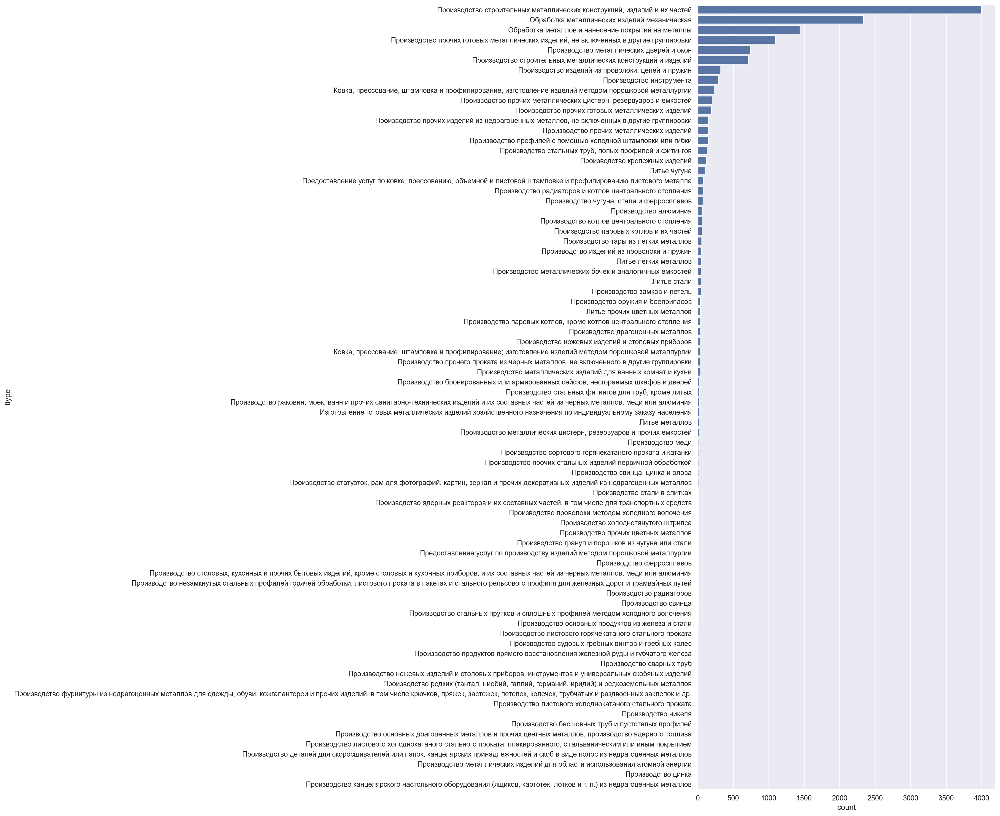

In [59]:
fig, axes = plt.subplots(1, 1, figsize=(22, 18))
sns.countplot(y=main['ttype'], order=main['ttype'].value_counts().index)
ax.set_title(col)
ax.set_xlabel("Количество")
ax.set_ylabel("")
plt.tight_layout()
plt.show()

Попробуем нестандартный способ - кластеризация. Возможно, KMeans сможет разделить наш столбец на более менее правдоподобные группы.

Сначала проведем векторизацию TF-IDF наших профессий.

In [60]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD

texts = main['ttype'].fillna("").astype(str).values
tfidf = TfidfVectorizer(
    max_features=10000,
    ngram_range=(1, 2),
    min_df=3,
    max_df=0.5
)

X_tfidf = tfidf.fit_transform(texts)
svd = TruncatedSVD(n_components=50, random_state=42)
embeddings = svd.fit_transform(X_tfidf)
print(embeddings.shape)

(13632, 50)


Далее подберем оптимальный гиперпараметр - число кластеров - с помощью библиотеки optuna и обучим KMeans из sklearn. В качестве метрики оптимизации будем использовать:

$
   \text{Silhouette Score} \in [0, 1] = \sum_i \frac{b_i - a_i}{\max(a_i, b_i)} \rightarrow max
   $
   - $a_i$ - среднее расстояние до точек внутри своего кластера.
   - $b_i$ - среднее расстояние до точек из ближайшего кластера.
   - Если в своем кластере точки близко - кластер плотный - идеальный вариант: метрика равна единице.
   - Если свой кластер совпадает с соседним - кластеры неразделимы - метрика равна нулю.
   - Чем более однородны и разделимы кластеры, тем лучше.

In [61]:
import optuna
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

def objective(trial):
    n_clusters = trial.suggest_int('n_clusters', 2, 6)
    model = KMeans(n_clusters=n_clusters, random_state=99, n_init='auto')
    labels = model.fit_predict(embeddings)
    score = silhouette_score(
        embeddings, labels,
        sample_size=min(10000, embeddings.shape[0]),
        random_state=42
    )
    return score

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=15, show_progress_bar=True)

[I 2025-12-15 00:36:54,231] A new study created in memory with name: no-name-d8ed5e33-4c56-4f97-99eb-5fdf944c7795
Best trial: 0. Best value: 0.472966:   7%|▋         | 1/15 [00:00<00:13,  1.02it/s]

[I 2025-12-15 00:36:55,216] Trial 0 finished with value: 0.47296622549407175 and parameters: {'n_clusters': 3}. Best is trial 0 with value: 0.47296622549407175.


Best trial: 0. Best value: 0.472966:  13%|█▎        | 2/15 [00:01<00:11,  1.10it/s]

[I 2025-12-15 00:36:56,073] Trial 1 finished with value: 0.3083904433284737 and parameters: {'n_clusters': 2}. Best is trial 0 with value: 0.47296622549407175.


Best trial: 2. Best value: 0.688325:  20%|██        | 3/15 [00:02<00:10,  1.16it/s]

[I 2025-12-15 00:36:56,877] Trial 2 finished with value: 0.6883247142493947 and parameters: {'n_clusters': 6}. Best is trial 2 with value: 0.6883247142493947.


Best trial: 2. Best value: 0.688325:  27%|██▋       | 4/15 [00:03<00:09,  1.19it/s]

[I 2025-12-15 00:36:57,677] Trial 3 finished with value: 0.6132970442296001 and parameters: {'n_clusters': 4}. Best is trial 2 with value: 0.6883247142493947.


Best trial: 2. Best value: 0.688325:  33%|███▎      | 5/15 [00:04<00:08,  1.19it/s]

[I 2025-12-15 00:36:58,515] Trial 4 finished with value: 0.47296622549407175 and parameters: {'n_clusters': 3}. Best is trial 2 with value: 0.6883247142493947.


Best trial: 2. Best value: 0.688325:  40%|████      | 6/15 [00:05<00:07,  1.20it/s]

[I 2025-12-15 00:36:59,338] Trial 5 finished with value: 0.6132970442296001 and parameters: {'n_clusters': 4}. Best is trial 2 with value: 0.6883247142493947.


Best trial: 2. Best value: 0.688325:  47%|████▋     | 7/15 [00:05<00:06,  1.17it/s]

[I 2025-12-15 00:37:00,229] Trial 6 finished with value: 0.47296622549407175 and parameters: {'n_clusters': 3}. Best is trial 2 with value: 0.6883247142493947.


Best trial: 2. Best value: 0.688325:  53%|█████▎    | 8/15 [00:06<00:05,  1.18it/s]

[I 2025-12-15 00:37:01,056] Trial 7 finished with value: 0.6883247142493947 and parameters: {'n_clusters': 6}. Best is trial 2 with value: 0.6883247142493947.


Best trial: 2. Best value: 0.688325:  60%|██████    | 9/15 [00:07<00:05,  1.18it/s]

[I 2025-12-15 00:37:01,909] Trial 8 finished with value: 0.47296622549407175 and parameters: {'n_clusters': 3}. Best is trial 2 with value: 0.6883247142493947.


Best trial: 2. Best value: 0.688325:  67%|██████▋   | 10/15 [00:08<00:04,  1.19it/s]

[I 2025-12-15 00:37:02,727] Trial 9 finished with value: 0.6883247142493947 and parameters: {'n_clusters': 6}. Best is trial 2 with value: 0.6883247142493947.


Best trial: 2. Best value: 0.688325:  73%|███████▎  | 11/15 [00:09<00:03,  1.21it/s]

[I 2025-12-15 00:37:03,535] Trial 10 finished with value: 0.6694263140707042 and parameters: {'n_clusters': 5}. Best is trial 2 with value: 0.6883247142493947.


Best trial: 2. Best value: 0.688325:  80%|████████  | 12/15 [00:10<00:02,  1.20it/s]

[I 2025-12-15 00:37:04,376] Trial 11 finished with value: 0.6883247142493947 and parameters: {'n_clusters': 6}. Best is trial 2 with value: 0.6883247142493947.


Best trial: 2. Best value: 0.688325:  87%|████████▋ | 13/15 [00:10<00:01,  1.20it/s]

[I 2025-12-15 00:37:05,214] Trial 12 finished with value: 0.6694263140707042 and parameters: {'n_clusters': 5}. Best is trial 2 with value: 0.6883247142493947.


Best trial: 2. Best value: 0.688325:  93%|█████████▎| 14/15 [00:11<00:00,  1.20it/s]

[I 2025-12-15 00:37:06,052] Trial 13 finished with value: 0.6883247142493947 and parameters: {'n_clusters': 6}. Best is trial 2 with value: 0.6883247142493947.


Best trial: 2. Best value: 0.688325: 100%|██████████| 15/15 [00:12<00:00,  1.19it/s]

[I 2025-12-15 00:37:06,875] Trial 14 finished with value: 0.6694263140707042 and parameters: {'n_clusters': 5}. Best is trial 2 with value: 0.6883247142493947.


In [62]:
best_k = study.best_params['n_clusters']
final_km = KMeans(n_clusters=best_k, random_state=1337, n_init='auto').fit(embeddings)
main['cluster_ttype'] = final_km.labels_

In [63]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)

    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

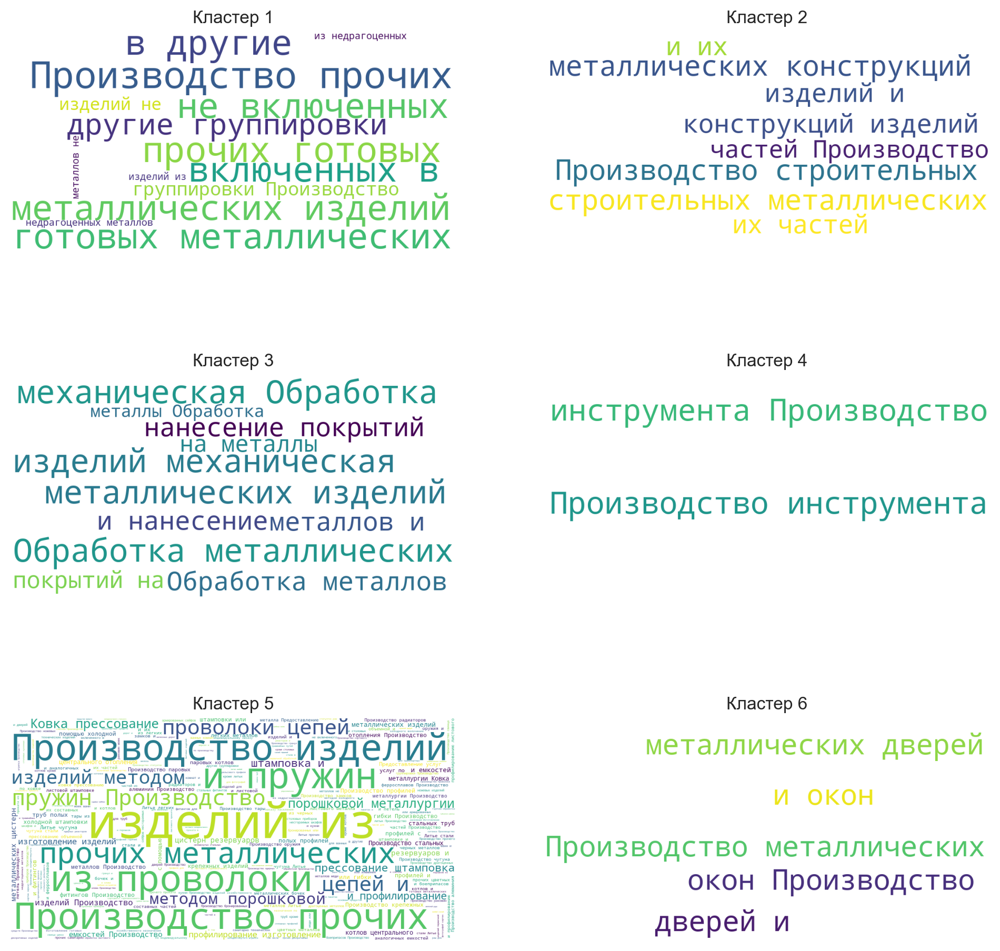

In [64]:
fig, axes = plt.subplots(3, 2, figsize=(12, 12))

for ax, cluster_num in zip(axes.flatten(), range(study.best_params['n_clusters'])):
    cluster_prof = main.loc[main['cluster_ttype'] == cluster_num, 'ttype']
    wc = draw_wordcloud(cluster_prof)
    ax.imshow(wc)
    ax.axis('off')
    ax.set_title(f"Кластер {cluster_num + 1}")
plt.show()

In [65]:
cluster_names = {
    0: "Разнородные металлические изделия",
    1: "Металлоконструкции для строительства",
    2: "Покрытия и обработка поверхностей",
    3: "Инструмент и оснастка",
    4: "Металлоизделия массового сегмента",
    5: "Окна и двери"
}

main["cluster_ttype"] = main["cluster_ttype"].map(cluster_names)

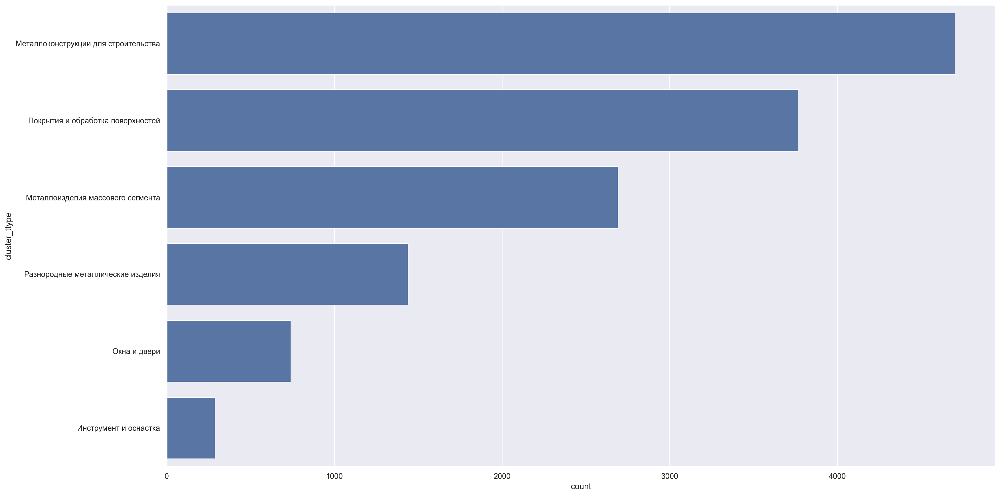

In [66]:
fig, axes = plt.subplots(1, 1, figsize=(20, 10))
sns.countplot(y=main['cluster_ttype'], order=main['cluster_ttype'].value_counts().index)
ax.set_title(col)
ax.set_xlabel("Количество")
ax.set_ylabel("")
plt.tight_layout()
plt.show()

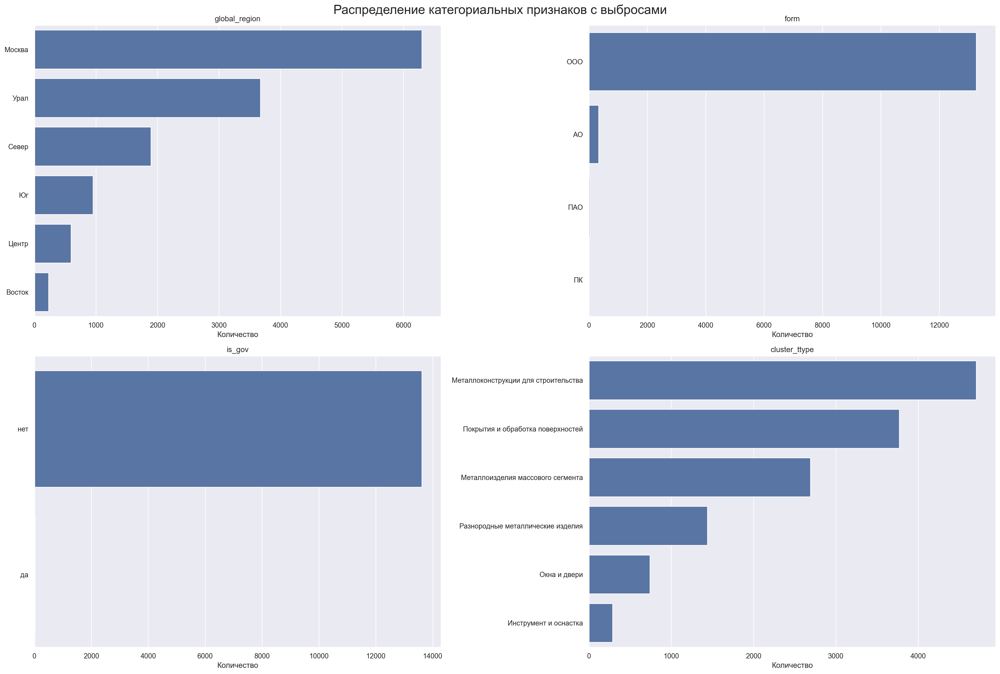

In [67]:
categorical = [
    'global_region', 'form', 'is_gov', 'cluster_ttype'
]

fig, axes = plt.subplots(2, 2, figsize=(22, 15))
plt.suptitle('Распределение категориальных признаков с выбросами', fontsize=20)

for ax, col in zip(axes.flatten(), categorical):
    if col in main.columns:
        sns.countplot(y=main[col], ax=ax, order=main[col].value_counts().index)
        ax.set_title(col)
        ax.set_xlabel("Количество")
        ax.set_ylabel("")

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()


In [68]:
main["form"] = main["form"].replace({"ПК": "Другие", "ФЮЛ": "Другие"})

### 2.2 Зависимость целевой переменной от признаков.

Разобьем признаки на бины и построим графики Default Rate по бинам  для каждого числового признака.

In [69]:
binned_data = main.copy()

for col in numeric:
    binned_data[col] = pd.qcut(binned_data[col], q=10, duplicates='drop')

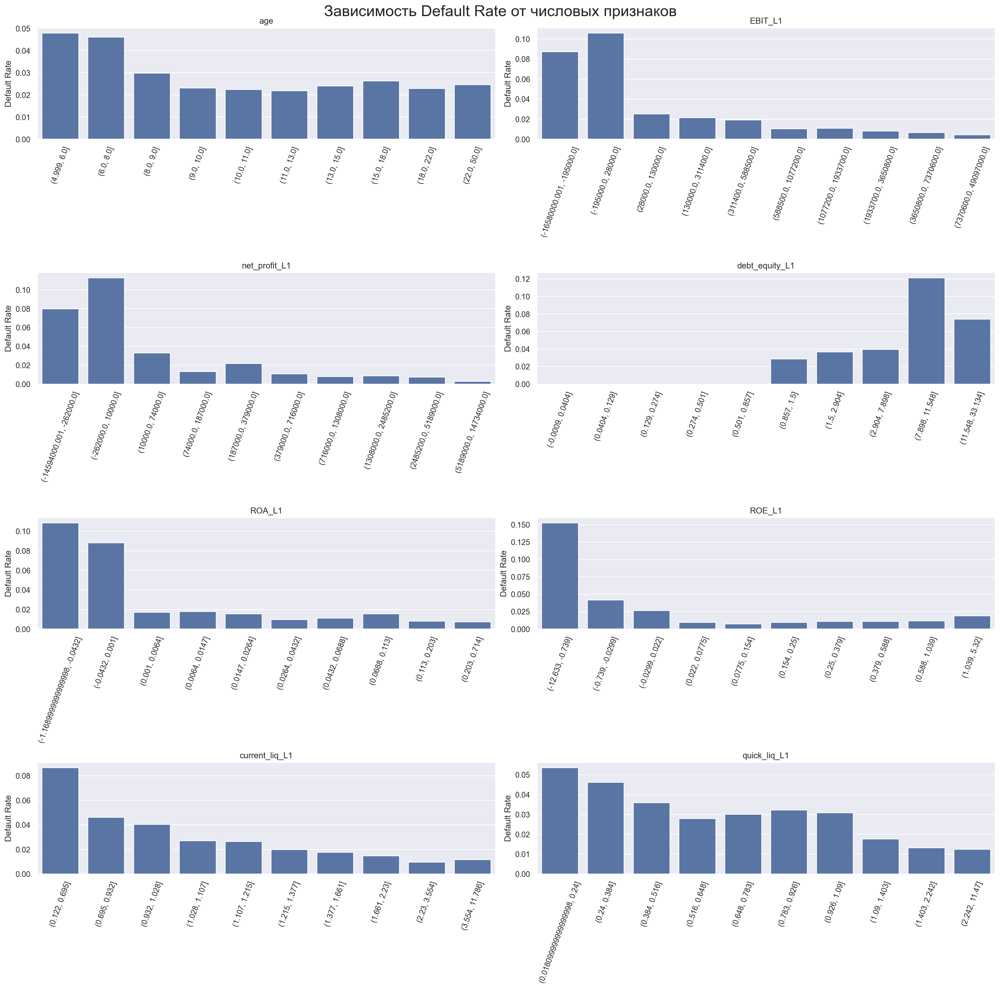

In [70]:
fig, axes = plt.subplots(4, 2, figsize=(20, 20))
plt.suptitle('Зависимость Default Rate от числовых признаков', fontsize=22)

for ax, col in zip(axes.flatten(), numeric):
        dr = binned_data.groupby(col, observed=False)['def'].mean().reset_index()
        dr['bin_str'] = dr[col].astype(str)

        sns.barplot(data=dr, x='bin_str', y='def', ax=ax)
        ax.set_title(col)
        ax.set_xlabel("")
        ax.set_ylabel("Default Rate")
        ax.tick_params(axis='x', rotation=70)

plt.tight_layout()
plt.show()

Default Rate экспоненционально зависит почти от всех признаков.

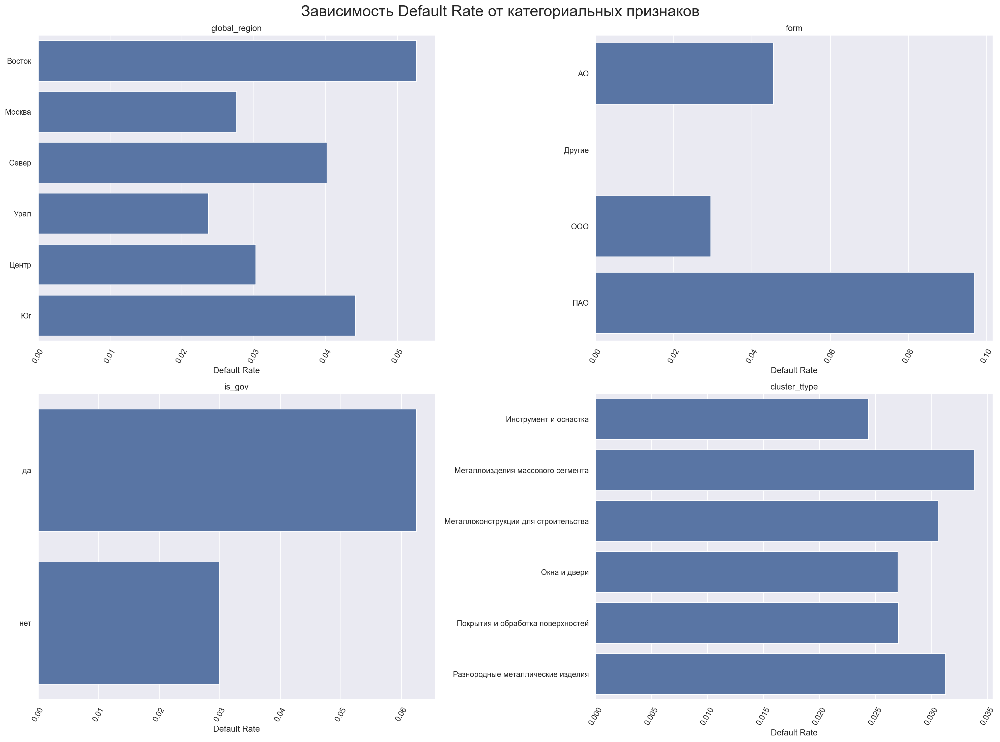

In [71]:
main[categorical] = main[categorical].astype(str)
fig, axes = plt.subplots(2, 2, figsize=(20, 15))
plt.suptitle('Зависимость Default Rate от категориальных признаков', fontsize=22)

for ax, col in zip(axes.flatten(), categorical):
        dr = main.groupby(col)['def'].mean().reset_index()
        sns.barplot(data=dr, x='def', y=col, ax=ax)
        ax.set_title(col)
        ax.set_xlabel("Default Rate")
        ax.set_ylabel("")
        ax.tick_params(axis='x', rotation=60)

plt.tight_layout()
plt.subplots_adjust(top=0.94)
plt.show()


Удалим категорию Другие в форме и неинтерпретируемо разбивающийся признак is_gov

In [72]:
main = main[main["form"] != "Другие"]
main = main.drop(columns="is_gov")

Категории каждого признака действительно достаточно сильно различаются по доли дефолтов

### 3. Feature Engineering.

Попробуем отобрать признаки по важности для включения в модель и избавиться от мультиколлинеарности.

In [74]:
main.to_excel("eda.xlsx", index=False)

In [75]:
y = main["def"]
X = main.drop(columns=["def", "inn", "name", "region", "grid_cell", "ttype", 'lat', 'lon'])
X["year"] = X["year"].astype(int)

In [76]:
zero = X[(y == 0)]
one = X[y == 1]

t = {}
for col in X.select_dtypes(include=['number']).columns:
    t[col] = np.abs(np.mean(one[col]) - np.mean(zero[col])) / np.sqrt((one.shape[0] * (np.std(one[col])) ** 2 + zero.shape[0] * (np.std(zero[col])) ** 2) / (zero.shape[0] + one.shape[0]))

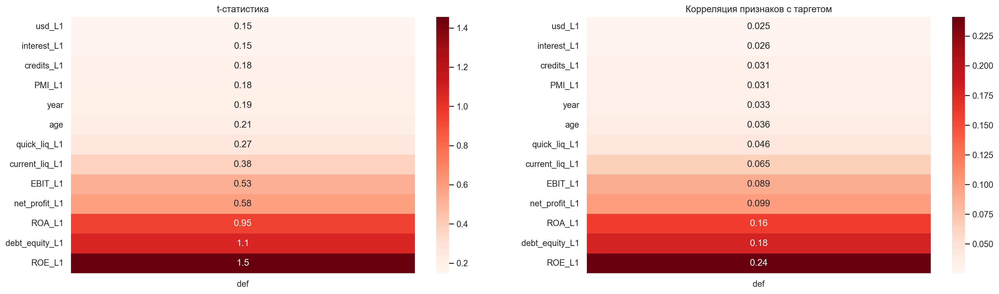

In [77]:
fig, axes = plt.subplots(1, 2, figsize=(22, 6))
sns.heatmap(data=X.select_dtypes(include=['number']).corrwith(y).to_frame("def").abs().sort_values(by="def"), annot=True, cmap="Reds", ax=axes[1])
axes[1].set(title="Корреляция признаков с таргетом")
sns.heatmap(data=pd.Series(t, name="def").to_frame("def").sort_values(by="def"), annot=True, cmap="Reds", ax=axes[0])
axes[0].set(title="t-статистика")
plt.show()

Целевая переменная не зависит линейно от признаков. Скорее всего линейные модели (логистическая регрессия, SVM) не покажут высокие метрики качества.

Проверим признаки на предмет мультиколлинераности. Для этого рассчитаем VIF:

 $$\text{VIF}_j \;=\; \frac{1}{1 - R_j^{2}}$$

где $R_j^{2}$ — коэффициент детерминации при регрессии $x_j$ на все остальные признаки $X_{\neg j}$.


In [78]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

x_1 = pd.get_dummies(X, drop_first=True).astype(float)

vif_df = pd.DataFrame({
    'Признак': x_1.columns,
    'VIF':     [variance_inflation_factor(x_1.values, i)
                for i in range(x_1.shape[1])]
})

vif_df = vif_df.sort_values('VIF', ascending=False).reset_index(drop=True)
vif_df[vif_df["VIF"] > 3]

C:\Users\Admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


,Признак,VIF
0,year,inf
1,PMI_L1,inf
2,interest_L1,inf
3,usd_L1,inf
4,credits_L1,inf
5,global_region_Москва,15.527982
6,global_region_Урал,12.631702
7,cluster_ttype_Металлоконструкции для строитель...,11.522328
8,cluster_ttype_Покрытия и обработка поверхностей,10.315089
9,cluster_ttype_Металлоизделия массового сегмента,8.390809


Построим корреляционную матрицу для признаков с VIF > 3 и увидим, откуда возникает линейная зависимость.

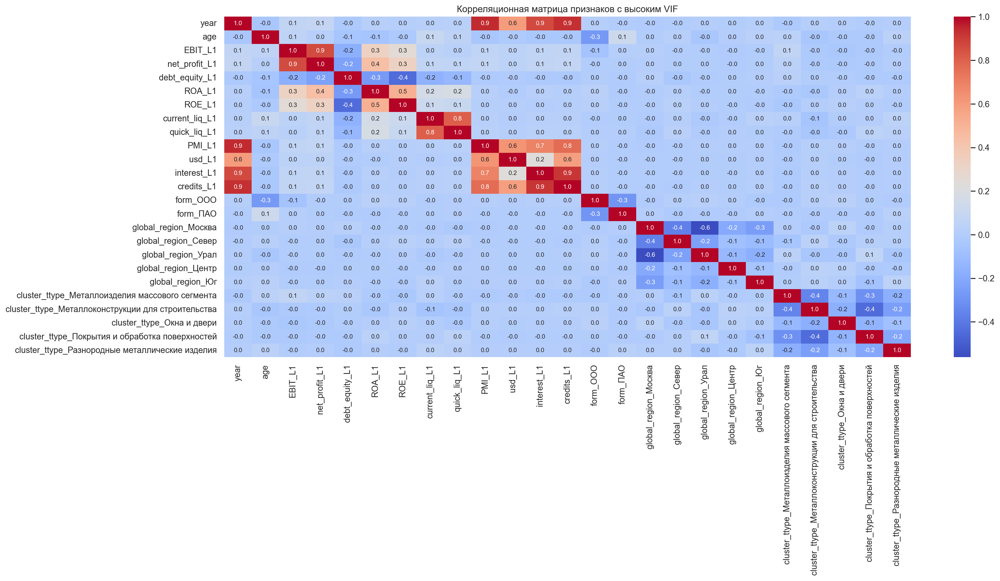

In [79]:
plt.figure(figsize=(20, 8))
sns.heatmap(data=x_1.corr(), annot=True, cmap="coolwarm", fmt='.1f', annot_kws={"size": 8})
plt.title("Корреляционная матрица признаков с высоким VIF")
plt.show()

Ожидаемо, макрофакторы сильно коррелируют друг с другом и годом. Также наблюдается высокая абсолютная корреляция для пар признаков EBIT и чистая прибыль, ROA и ROE, быстрая и текущая ликвидность.

### 3. Train / Test split.

Разобьем стратифицировано данные на обучающую, валидационную для подбора гиперпараметров и тестовую выборки.

In [80]:
X_train_val, X_test, y_train_val, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val,
    test_size=0.15 / 0.90,
    stratify=y_train_val,
    random_state=42
)

print("Train size:", X_train.shape)
print("Val size:", X_val.shape)
print("Test size:", X_test.shape)
print("Default rate (train):", y_train.mean())
print("Default rate (val):", y_val.mean())
print("Default rate (test):", y_test.mean())

Train size: (9085, 16)
Val size: (1817, 16)
Test size: (2726, 16)
Default rate (train): 0.03004953219592735
Default rate (val): 0.02971931755641167
Default rate (test): 0.03008070432868672


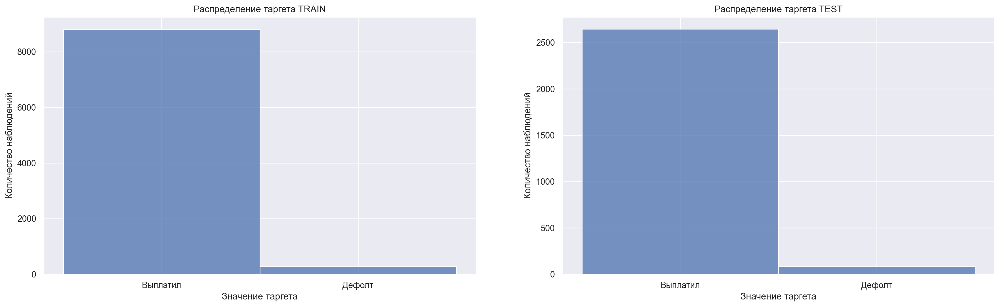

In [81]:
fig, axes = plt.subplots(1, 2, figsize=(22, 6))

sns.histplot(data=y_train, discrete=True, ax=axes[0])
axes[0].set(title="Распределение таргета TRAIN", xlabel="Значение таргета", ylabel="Количество наблюдений")
axes[0].set_xticks([0, 1])
axes[0].set_xticklabels(["Выплатил", "Дефолт"])
sns.histplot(data=y_test, discrete=True, ax=axes[1])
axes[1].set(title="Распределение таргета TEST", xlabel="Значение таргета", ylabel="Количество наблюдений")
axes[1].set_xticks([0, 1])
axes[1].set_xticklabels(["Выплатил", "Дефолт"])
plt.show()

In [82]:
train_df = X_train.copy()
train_df['y'] = y_train.values
train_df['split'] = 'train'

test_df = X_test.copy()
test_df['y'] = y_test.values
test_df['split'] = 'test'

both = pd.concat([train_df, test_df], ignore_index=True)
dr_by_year = (
    both
    .groupby(['split', 'year'])['y']
    .mean()
    .reset_index()
    .pivot(index='year', columns='split', values='y')
    .sort_index()
)
dr_by_year

split,test,train
year,,
2021,0.032698,0.039033
2022,0.030075,0.032759
2023,0.040639,0.025080
2024,0.015674,0.022573


Как упоминалось ранее, наблюдается дисбаланс классов. Применим технику undersampling для повышения соотношения положительного и отрицательного классов. Доведем долю дефолтов до 7%. Наблюдения отрицательного класса удаляем случайным образом. 

In [83]:
X0 = X_train[y_train == 0]
X1 = X_train[y_train == 1]

y0 = y_train[y_train == 0]
y1 = y_train[y_train == 1]

N_pos = len(X1)
target_ratio = 0.05

N_neg_target = int(N_pos / target_ratio - N_pos)
X0_sampled = X0.sample(N_neg_target, replace=False, random_state=42)
y0_sampled = y0.loc[X0_sampled.index]

X_train_under = pd.concat([X1, X0_sampled], axis=0)
y_train_under = pd.concat([y1, y0_sampled], axis=0)

idx = np.random.RandomState(42).permutation(len(X_train_under))
X_train_under = X_train_under.iloc[idx]
y_train_under = y_train_under.iloc[idx]

print("Final size:", X_train_under.shape)
print("Default rate:", y_train_under.mean())

Final size: (5460, 16)
Default rate: 0.05


### 4. Интерпретируемая модель.

Построим логистическую регрессию поверх WOE-преобразований.

$$\text{WOE}_i = \log\left(\frac{\text{GoodRate}_i}{\text{BadRate}_i}\right)$$

где:

* $\text{BadRate}_i = \frac{\text{Количество плохих в бине } i}{\text{Общее количество плохих}}$

* $\text{GoodRate}_i = \frac{\text{Количество хороших в бине } i}{\text{Общее количество хороших}}$

Воспользуемся пакетом wing от СберБанка. К сожалению, данный пакет весьма устарел, поэтому пришлось покапаться в нем и исправить синтаксические ошибки (например, аргумент sparse сейчас отсутствует в OneHotEncoder, заменил на sparse_output).

In [84]:
setattr(np, 'float', float)
from wing import WingsOfEvidence

woe_transformer = WingsOfEvidence(
    columns_to_apply="all",
    bin_minimal_size=0.01,
    bin_size_increase=0.02,
    is_monotone=True,
    optimizer="tree-binning",
    n_initial=20,
    n_target=10,
    tree_random_state=777,
    verbose=True
)

woe_transformer.fit(X_train_under, y_train_under)

Working with variable: year
Started fit
Data check success,df size: 5460
Got G: 273 B: 5187
Missing values done, miss woe is {'good': None, 'bad': None, 'total': None, 'woe': None, 'local_event_rate': None},df size: 5460
Spec values done, spec woe is {},df size: 5460
X-vector type is numeric
D-values in  clear X: 4
Converting data type to discrete because of low uniques
Current vector type: d
Inside vector type 'd'
Discrete woe df created
Working with variable: age
Started fit
Data check success,df size: 5460
Got G: 273 B: 5187
Missing values done, miss woe is {'good': None, 'bad': None, 'total': None, 'woe': None, 'local_event_rate': None},df size: 5460
Spec values done, spec woe is {},df size: 5460
X-vector type is numeric
D-values in  clear X: 32
Current vector type: c
Starting optimizer search
Doing tree-binning
(array([-inf,  9.5,  inf]), 0)
Optimal edges found: [-inf  9.5  inf]
With gini: 0.0000
Working with variable: form
Started fit
Data check success,df size: 5460
Got G: 273 B

,bin_minimal_size,0.01
,is_monotone,True
,bin_size_increase,0.02
,columns_to_apply,Index(['year'...type='object')
,n_initial,20
,n_target,10
,mass_spec_values,{}
,optimizer,'tree-binning'
,only_values,True
,tree_random_state,777
,verbose,True


In [85]:
x_train_woe = woe_transformer.transform(X_train_under)
x_test_woe = woe_transformer.transform(X_test)

c:\Users\Admin\Desktop\Вышка\risk\wing\core\main.py:281: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  full_transform = pd.concat([miss_df, spec_df, clear_df], axis=0)  # ["woe"]
c:\Users\Admin\Desktop\Вышка\risk\wing\core\main.py:281: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  full_transform = pd.concat([miss_df, spec_df, clear_df], axis=0)  # ["woe"]
c:\Users\Admin\Desktop\Вышка\risk\wing\core\main.py:281: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries i

In [86]:
x_train_woe

,WOE_year,WOE_age,WOE_form,WOE_EBIT_L1,WOE_net_profit_L1,WOE_debt_equity_L1,WOE_ROA_L1,WOE_ROE_L1,WOE_current_liq_L1,WOE_quick_liq_L1,WOE_PMI_L1,WOE_usd_L1,WOE_interest_L1,WOE_credits_L1,WOE_global_region,WOE_cluster_ttype
0,-0.276305,0.213002,0.011342,1.843053,1.785600,-0.175265,0.939073,0.932245,0.082184,-0.057208,-0.276305,-0.276305,-0.276305,-0.276305,0.052148,-0.001404
1,-0.276305,0.213002,0.011342,0.216954,0.774661,-0.361759,0.939073,0.932245,0.082184,-0.458775,-0.276305,-0.276305,-0.276305,-0.276305,0.052148,-0.061261
2,-0.276305,0.213002,0.011342,-1.243832,-1.295553,-0.175265,-1.256820,-0.802326,-0.661085,-0.057208,-0.276305,-0.276305,-0.276305,-0.276305,0.306074,-0.001404
3,0.287156,-0.313225,0.011342,0.216954,-0.111226,0.092906,0.483076,-0.802326,0.278067,0.795060,0.287156,0.287156,0.287156,0.287156,0.052148,0.068007
4,0.287156,-0.313225,0.011342,1.356503,-0.111226,-1.312401,0.483076,-0.802326,0.278067,-0.057208,0.287156,0.287156,0.287156,0.287156,0.306074,0.068007
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5455,-0.276305,-0.313225,0.011342,0.216954,0.774661,-1.312401,1.784913,-0.802326,0.992434,0.795060,-0.276305,-0.276305,-0.276305,-0.276305,0.052148,0.068007
5456,-0.276305,0.213002,0.011342,0.216954,-0.111226,-1.312401,0.483076,-0.802326,-0.661085,-0.057208,-0.276305,-0.276305,-0.276305,-0.276305,0.052148,-0.001404
5457,0.287156,-0.313225,0.011342,1.843053,1.785600,-0.175265,0.939073,0.932245,-0.661085,-0.458775,0.287156,0.287156,0.287156,0.287156,0.052148,-0.001404
5458,-0.080735,0.213002,0.011342,1.843053,1.785600,0.092906,1.784913,0.932245,0.992434,0.795060,-0.080735,-0.080735,-0.080735,-0.080735,0.306074,-0.099530


Отберем переменные для обучения, исходя из WOE-преобразований признаков. Сделаем это с помощью значения IV (Information Value):

**Information Value (IV)** — это метрика для оценки силы связи между независимой переменной и целевой переменной в задачах бинарной классификации.

Формула для расчёта IV:

$$IV = \sum_{i=1}^{n} (\text{BadRate}_i - \text{GoodRate}_i)\times\text{WOE}_i$$

где:

* $\text{BadRate}_i = \frac{\text{Количество плохих в бине } i}{\text{Общее количество плохих}}$

* $\text{GoodRate}_i = \frac{\text{Количество хороших в бине } i}{\text{Общее количество хороших}}$

* $\text{WOE}_i = \log\left(\frac{\text{GoodRate}_i}{\text{BadRate}_i}\right)$

In [222]:
iv_values = {}

for col, wing in woe_transformer.fitted_wing.items():
    agg = wing.get_wing_agg(only_clear=True).copy()
    agg['good_pct'] = agg['good'] / agg['good'].sum()
    agg['bad_pct']  = agg['bad']  / agg['bad'].sum()
    agg['iv_bin'] = (agg['bad_pct'] - agg['good_pct']) * agg['woe']
    iv_values[col] = agg['iv_bin'].sum()

for feature, IV in sorted(iv_values.items(), key=lambda item: item[1], reverse=True):
    print("Признак", feature, '-', "IV", IV.round(4))

Признак net_profit_L1 - IV 1.2423
Признак EBIT_L1 - IV 1.2392
Признак ROA_L1 - IV 0.9924
Признак ROE_L1 - IV 0.7448
Признак debt_equity_L1 - IV 0.6815
Признак current_liq_L1 - IV 0.5449
Признак quick_liq_L1 - IV 0.3021
Признак age - IV 0.1226
Признак year - IV 0.1075
Признак PMI_L1 - IV 0.1075
Признак usd_L1 - IV 0.1075
Признак interest_L1 - IV 0.1075
Признак credits_L1 - IV 0.1075
Признак global_region - IV 0.0698
Признак cluster_ttype - IV 0.0158
Признак form - IV 0.007


Вот теперь исключим линейно-зависимые признаки, имеющие меньший IV.

In [91]:
categorical = ['global_region', 'form', 'PMI_L1', 'cluster_ttype']
numeric = ['age', 'net_profit_L1', 'debt_equity_L1', 'ROA_L1', 'current_liq_L1']
WOE_categorical = ['WOE_' + col for col in categorical]
WOE_numeric = ['WOE_' + col for col in numeric]

In [224]:
x_train_woe = x_train_woe[WOE_numeric + WOE_categorical]
x_test_woe = x_test_woe[WOE_numeric + WOE_categorical]

In [225]:
import statsmodels.api as sm

X_sm = sm.add_constant(x_train_woe)  
y_sm = y_train_under.values            

logit_model = sm.Logit(y_sm, X_sm)
logit_res = logit_model.fit(cov_type='HC3')
print(logit_res.summary()) 


Optimization terminated successfully.
         Current function value: 0.147825
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 5460
Model:                          Logit   Df Residuals:                     5450
Method:                           MLE   Df Model:                            9
Date:                Mon, 08 Dec 2025   Pseudo R-squ.:                  0.2553
Time:                        01:31:40   Log-Likelihood:                -807.12
converged:                       True   LL-Null:                       -1083.9
Covariance Type:                  HC3   LLR p-value:                1.939e-113
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -3.6448      0.112    -32.461      0.000      -3.865      -3.425
WOE_a

In [226]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

c_lr = np.logspace(-6, 3, 40)
searcher_lr = GridSearchCV(LogisticRegression(max_iter=1000), {'C': c_lr}, scoring='average_precision', cv=10)
searcher_lr.fit(x_train_woe, y_train_under)
best_lr = searcher_lr.best_estimator_

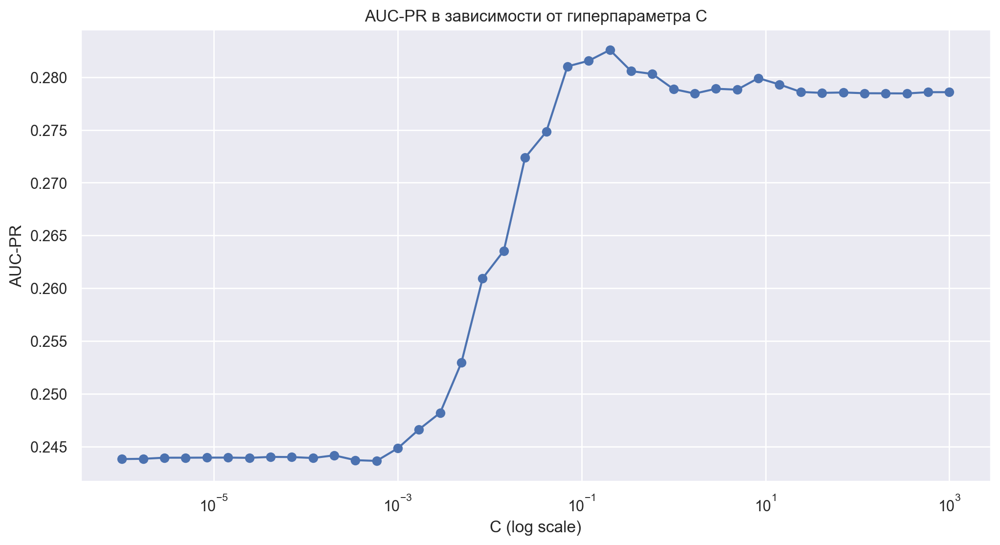

In [227]:
C_values = searcher_lr.cv_results_['param_C'].data.astype(float)
mean_auc = searcher_lr.cv_results_['mean_test_score']

plt.semilogx(C_values, mean_auc, marker='o')
plt.xlabel('C (log scale)')
plt.ylabel('AUC-PR')
plt.title('AUC-PR в зависимости от гиперпараметра C')
plt.show()

На графике видно, что средний AUC-ROC на кросс-валидации быстро растет приблизительно с $10^{-5}$ до $1$. Далее качество снова выходит на плато.

Посмотрим на метрики качества оцененной модели

In [ ]:
def plot_gini_curve(y_true, y_score):
    y_true = np.array(y_true)
    y_score = np.array(y_score)

    order = np.argsort(y_score)[::-1]
    y_true_sorted = y_true[order]

    cum_defaults = np.cumsum(y_true_sorted) / np.sum(y_true_sorted)
    cum_pop = np.arange(1, len(y_true_sorted) + 1) / len(y_true_sorted)

    plt.figure()
    sns.lineplot(x=cum_pop, y=cum_defaults, label='Кривая Лоренца')
    sns.lineplot(x=[0, 1], y=[0, 1], linestyle='--', label='Линия равенства', color='r')
    plt.xlabel('Доля наблюдений')
    plt.ylabel('Доля дефолтов')
    plt.title('Кривая Лоренца')
    plt.legend()
    plt.show()

    auc = roc_auc_score(y_true, y_score)
    gini = 2 * auc - 1
    print("Gini-коэффициент -", round(gini, 4))


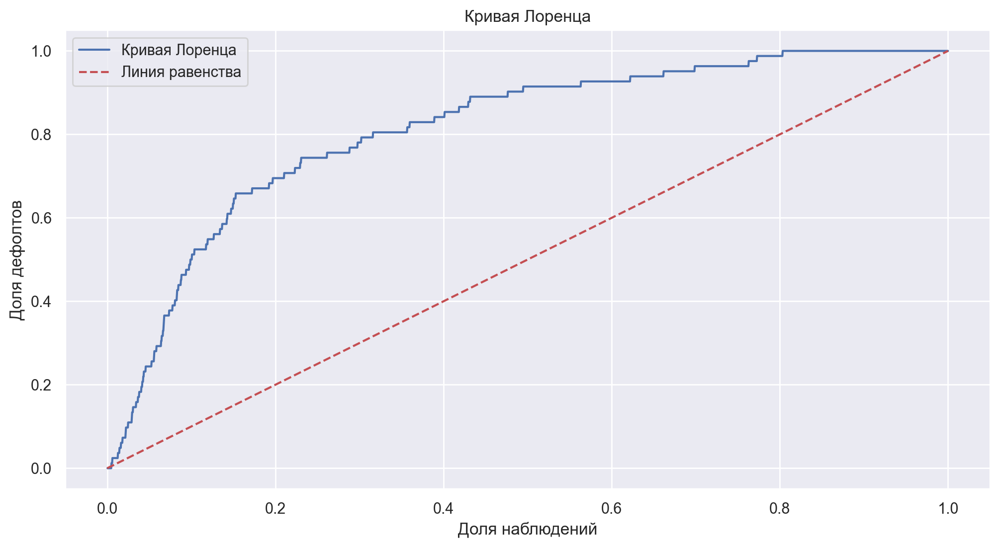

Gini-коэффициент - 0.6436


In [229]:
lr_pred = best_lr.predict_proba(x_test_woe)[:, 1]
plot_gini_curve(y_test, lr_pred)

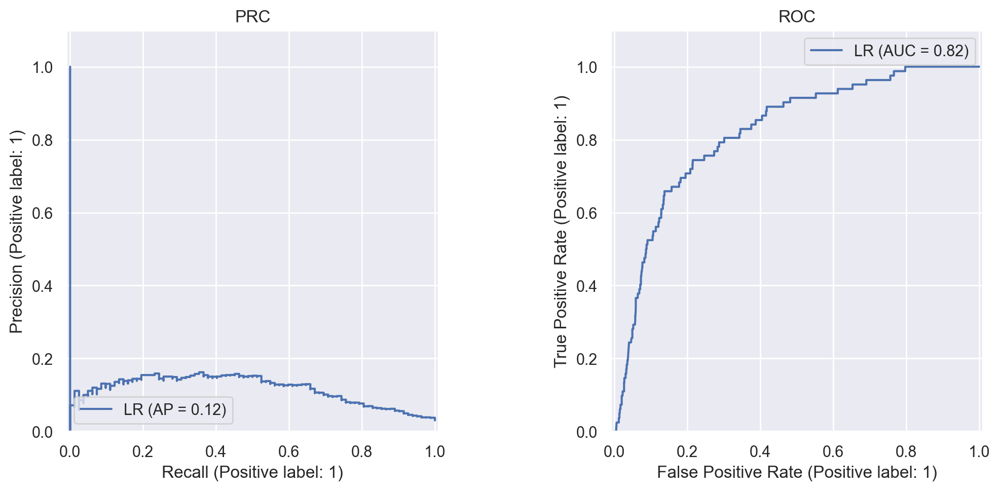

In [230]:
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay

def depict_pr_roc(y_true, y_pred, classifier_name='Some Classifier', ax=None):
    if ax is None:
        fig, ax = plt.subplots(1, 2, figsize=(11, 5))

    PrecisionRecallDisplay.from_predictions(y_true, y_pred, ax=ax[0], name=classifier_name)
    ax[0].set_title("PRC")
    ax[0].set_ylim(0, 1.1)

    RocCurveDisplay.from_predictions(y_true, y_pred, ax=ax[1], name=classifier_name)
    ax[1].set_title("ROC")
    ax[1].set_ylim(0, 1.1)

    plt.tight_layout()
    plt.legend()

depict_pr_roc(y_test, lr_pred, 'LR')

Скоринговая карта.

Логистическая регрессия моделирует вероятность события через логарифм отношения шансов "Odds":

$$\text{logit}(p) = \log(\frac{p}{1-p}) = \beta_0 + \sum_j\beta_j \cdot \text{WOE}_j$$

Чтобы не работать с коэффициентами и логарифмом шансов строят скоринговую карту. Каждому WOE-бину присваивается некоторый балл, а сумма всех баллов является итоговой оценкой. Для этого вводят переменные:

* PDO - количество баллов, при котором Odds удваивается - полезно, чтобы оценка менялась на фиксированное число;

* Базовый балл - константа, изначальное значение оценки.

Балл для каждого WOE-бина рассчитывается по формуле:

$$\text{Score} = -\beta_j \cdot \text{WOE} \cdot \frac{\text{PDO}}{\ln2}$$

Перед коэффициентом стоит знак "минус", чтобы соблюсти правило - чем выше риск, тем меньше балл.

In [235]:
# ChatGPT o4-mini-high - не знал как технически построить карту и синтаксис сберовской библиотеки. ИИ помог.
PDO = 20
factor = PDO / np.log(2)
intercept = best_lr.intercept_[0]
coefs = best_lr.coef_[0]

feature_names = x_train_woe.columns.tolist()
intercept_points = - intercept * factor
scorecard_entries = []
scorecard_entries.append({
    'variable': 'Intercept',
    'bin': '',
    'WOE': np.nan,
    'points': round(intercept_points, 0)
})

for idx, feature in enumerate(feature_names):
    coef = coefs[idx]
    orig_var = feature.replace('WOE_', '')
    woe_fitter = woe_transformer.fitted_wing[orig_var]
    if woe_fitter.vector_type == "c":
        woe_table = woe_fitter.get_wing_agg(only_clear=True).reset_index()
        woe_table.columns = ['bin_interval', 'good', 'bad', 'total', 'WOE', 'local_event_rate']

        for _, row in woe_table.iterrows():
            woe_value = row['WOE']
            points = - coef * woe_value * factor
            scorecard_entries.append({
                'variable': orig_var,
                'bin': row['bin_interval'],
                'WOE': woe_value,
                'points': round(points, 0)
            })

    else:
        cat_map = woe_fitter.categories_woes.copy()

        for _, crow in cat_map.iterrows():
            category_value = crow["X"]
            woe_val = crow["woe"]
            points = - coef * woe_val * factor
            scorecard_entries.append({
                'variable': orig_var,
                'bin': category_value,
                'WOE': woe_val,
                'points': round(points, 0)
            })

scorecard = pd.DataFrame(scorecard_entries)
scorecard

,variable,bin,WOE,points
0,Intercept,,NaN,103.0
1,age,"(-inf, 9.5)",-0.418418,-11.0
2,age,"(9.5, inf)",0.295968,8.0
3,net_profit_L1,"(-inf, 4500.0)",-1.339609,-21.0
4,net_profit_L1,"(4500.0, 289500.0)",0.209417,3.0
5,net_profit_L1,"(289500.0, 864500.0)",1.121377,18.0
6,net_profit_L1,"(864500.0, 3159500.0)",1.408600,22.0
7,net_profit_L1,"(3159500.0, inf)",1.745761,27.0
8,debt_equity_L1,"(-inf, 1.0126999616622925)",0.091148,3.0
9,debt_equity_L1,"(1.0126999616622925, 2.190950036048889)",-0.154151,-5.0


### 5. Не интерпретируемая модель.

Наконец мы закончили с WOE-преобразованиями и логистической регрессией. Теперь мы готовы построить неинтерпретируемую модель с целью повышения качества. Я собираюсь построить три модели и выбрать лучшую из них:

1. Бустинг;
2. Случайный лес;
3. Ядровый SVM;

In [100]:
metrics = pd.DataFrame(
    columns=['auc_pr', 'roc_auc_score', 'gini']
)

In [149]:
column_transformer = ColumnTransformer([
    ('mean-target', TargetEncoder(random_state=42), categorical),
    ('scaling', StandardScaler(), numeric)
], remainder="drop")

def catboost_objective(trial: Trial):
    depth = trial.suggest_int('depth', 4, 8)
    iterations = trial.suggest_int('iterations', 100, 400)
    learning_rate = trial.suggest_float('learning_rate', 0.02, 0.2, log=True)
    subsample = trial.suggest_float('subsample', 0.7, 1.0)
    colsample_bylevel = trial.suggest_float('colsample_bylevel', 0.7, 1.0)
    l2_leaf_reg = trial.suggest_float('l2_leaf_reg', 2, 8)

    pipeline_cat = Pipeline([
        ('preprocessing', column_transformer),
        ('catboost', CatBoostClassifier(
            depth=depth,
            iterations=iterations,
            learning_rate=learning_rate,
            subsample=subsample,
            colsample_bylevel=colsample_bylevel,
            l2_leaf_reg=l2_leaf_reg,
            loss_function="Logloss",
            eval_metric="AUC",
            random_seed=42,
            verbose=False,
            early_stopping_rounds=40
        ))
    ])

    pipeline_cat.fit(X_train_under, y_train_under)
    y_pred_proba = pipeline_cat.predict_proba(X_val)[:, 1]
    auc_pr = average_precision_score(y_val, y_pred_proba)
    return auc_pr

In [150]:
sampler = TPESampler(seed=42)
study = optuna.create_study(direction='maximize', sampler=sampler)
study.optimize(catboost_objective, n_trials=500, timeout=3600)

print("Лучшие параметры:", study.best_params)
print("Лучший AUC-PR:", study.best_value)

[I 2025-12-14 19:39:40,350] A new study created in memory with name: no-name-84888da7-b091-47a1-8c64-27073d48ed8d


[I 2025-12-14 19:39:41,214] Trial 0 finished with value: 0.16747463526962542 and parameters: {'depth': 5, 'iterations': 386, 'learning_rate': 0.10790061933340454, 'subsample': 0.8795975452591109, 'colsample_bylevel': 0.7468055921327309, 'l2_leaf_reg': 2.9359671220172157}. Best is trial 0 with value: 0.16747463526962542.
[I 2025-12-14 19:39:41,996] Trial 1 finished with value: 0.19332578429719116 and parameters: {'depth': 4, 'iterations': 360, 'learning_rate': 0.0798261175712336, 'subsample': 0.9124217733388136, 'colsample_bylevel': 0.7061753482887407, 'l2_leaf_reg': 7.819459112971966}. Best is trial 1 with value: 0.19332578429719116.
[I 2025-12-14 19:39:42,720] Trial 2 finished with value: 0.21389852594726172 and parameters: {'depth': 8, 'iterations': 163, 'learning_rate': 0.030398696602619617, 'subsample': 0.7550213529560301, 'colsample_bylevel': 0.7912726728878613, 'l2_leaf_reg': 5.148538589793427}. Best is trial 2 with value: 0.21389852594726172.
[I 2025-12-14 19:39:43,142] Trial 3 

Лучшие параметры: {'depth': 5, 'iterations': 111, 'learning_rate': 0.048141448033430574, 'subsample': 0.800348627085813, 'colsample_bylevel': 0.9751382632790665, 'l2_leaf_reg': 3.07923639439213}
Лучший AUC-PR: 0.27064493831999004


Target under

In [94]:
best_params_cat = {'depth': 5, 'iterations': 306, 'learning_rate': 0.09502672231785156, 'subsample': 0.767904333707428, 'colsample_bylevel': 0.8623706853140792, 'l2_leaf_reg': 5.717148144228482}

AUC-PR: 0.22768214476202267
AUC-ROC: 0.8848889339876759


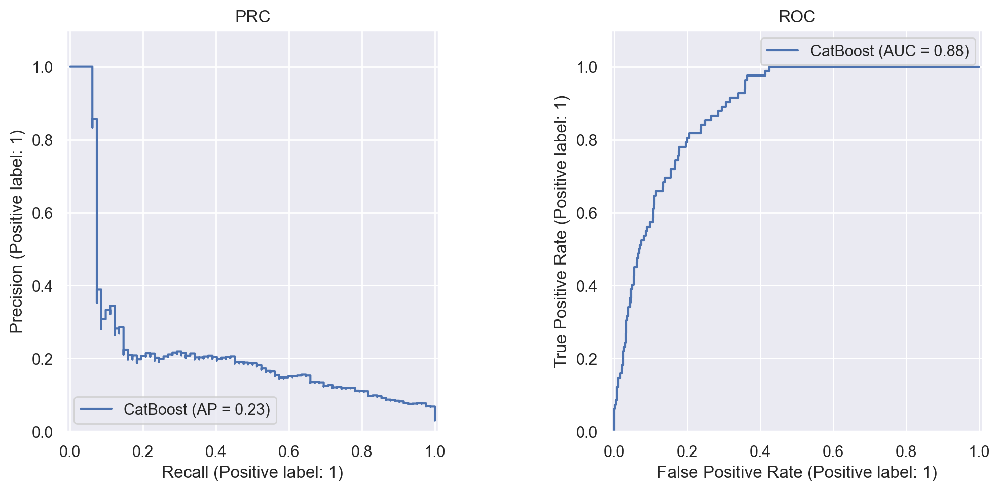

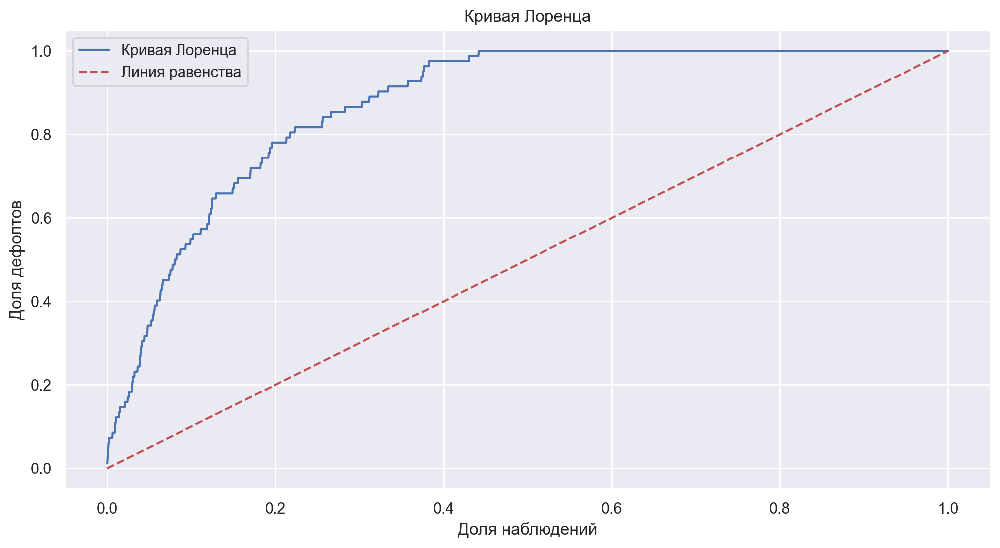

Gini-коэффициент - 0.7698


In [101]:
column_transformer = ColumnTransformer([
    ('mean-target', TargetEncoder(random_state=42), categorical),
    ('scaling', StandardScaler(), numeric)
], remainder="drop")

pipeline_cat = Pipeline([
    ('preprocessing', column_transformer),
    ('catboost', CatBoostClassifier(
        **best_params_cat,
        loss_function="Logloss",
        eval_metric="AUC",
        random_seed=42,
        verbose=False,
        early_stopping_rounds=40
    ))
])

pipeline_cat.fit(X_train_under, y_train_under)
cat_pred = pipeline_cat.predict_proba(X_test)[:, 1]
auc_pr_cat = average_precision_score(y_test, cat_pred)
auc_roc_cat = roc_auc_score(y_test, cat_pred)
gini_cat = 2 * auc_roc_cat - 1

print('AUC-PR:', auc_pr_cat)
print('AUC-ROC:', auc_roc_cat)
depict_pr_roc(y_test, cat_pred, 'CatBoost')
plot_gini_curve(y_test, cat_pred)
  
metrics.loc['CatBoost'] = [
    auc_pr_cat,
    auc_roc_cat,
    gini_cat
]

Random Forest

In [155]:
from sklearn.ensemble import RandomForestClassifier

column_transformer = ColumnTransformer([
    ('mean-target', TargetEncoder(random_state=42), categorical),
    ('scaling', StandardScaler(), numeric)
], remainder="drop")

def rf_objective(trial: Trial):
    n_estimators = trial.suggest_int("n_estimators", 100, 1000, step=100)
    max_depth = trial.suggest_int("max_depth", 5, 30)
    max_features = trial.suggest_float("max_features", 0.1, 1.0)
    min_samples_split = trial.suggest_int("min_samples_split", 2, 10)
    min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 4)
    bootstrap = trial.suggest_categorical("bootstrap", [True, False])

    pipeline_rf = Pipeline([
        ('preprocessing', column_transformer),
        ('rf', RandomForestClassifier(
            n_estimators=n_estimators,
            max_depth=max_depth,
            max_features=max_features,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            bootstrap=bootstrap,
            random_state=42,
            n_jobs=-1
        ))
    ])

    pipeline_rf.fit(X_train_under, y_train_under)
    y_pred_proba = pipeline_rf.predict_proba(X_val)[:, 1]
    auc_pr = average_precision_score(y_val, y_pred_proba)
    return auc_pr

In [156]:
sampler_rf = TPESampler(seed=42)
study_rf = optuna.create_study(direction='maximize', sampler=sampler_rf)
study_rf.optimize(rf_objective, n_trials=500, timeout=3600)

print("Лучшие параметры:", study_rf.best_params)
print("Лучший AUC-PR:", study_rf.best_value)

[I 2025-12-14 19:43:59,607] A new study created in memory with name: no-name-0ed25987-0f34-4bbd-9bdf-ef17e1122d80
[I 2025-12-14 19:44:01,160] Trial 0 finished with value: 0.1865018134815396 and parameters: {'n_estimators': 400, 'max_depth': 29, 'max_features': 0.7587945476302645, 'min_samples_split': 7, 'min_samples_leaf': 1, 'bootstrap': True}. Best is trial 0 with value: 0.1865018134815396.
[I 2025-12-14 19:44:04,243] Trial 1 finished with value: 0.1929862918620069 and parameters: {'n_estimators': 900, 'max_depth': 20, 'max_features': 0.737265320016441, 'min_samples_split': 2, 'min_samples_leaf': 4, 'bootstrap': True}. Best is trial 1 with value: 0.1929862918620069.
[I 2025-12-14 19:44:04,790] Trial 2 finished with value: 0.19346583835067388 and parameters: {'n_estimators': 200, 'max_depth': 9, 'max_features': 0.373818018663584, 'min_samples_split': 6, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 2 with value: 0.19346583835067388.
[I 2025-12-14 19:44:05,387] Trial 3 fini

Лучшие параметры: {'n_estimators': 300, 'max_depth': 27, 'max_features': 0.1312572406487043, 'min_samples_split': 6, 'min_samples_leaf': 4, 'bootstrap': True}
Лучший AUC-PR: 0.2505836123234952


In [157]:
best_params_rf = {'n_estimators': 300, 'max_depth': 27, 'max_features': 0.1312572406487043, 'min_samples_split': 6, 'min_samples_leaf': 4, 'bootstrap': True}

AUC-PR: 0.20301641591603597
AUC-ROC: 0.8702861518025166


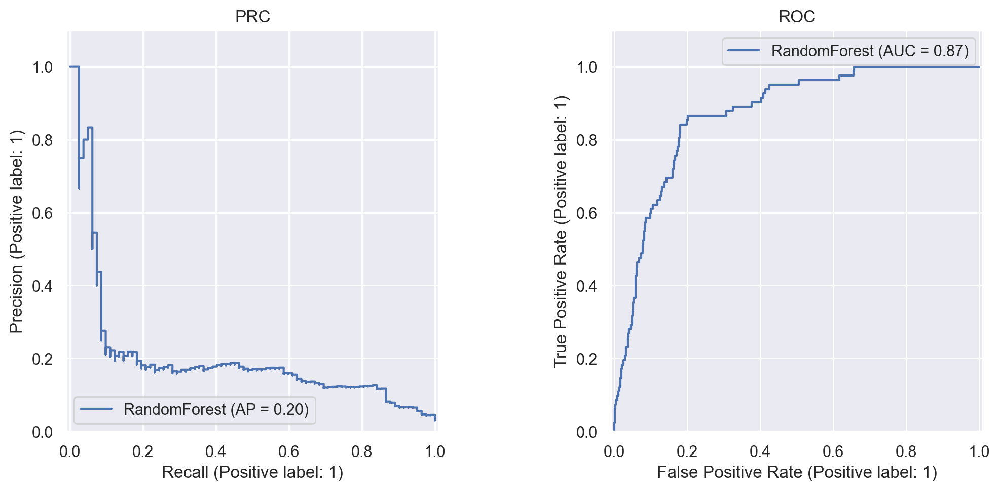

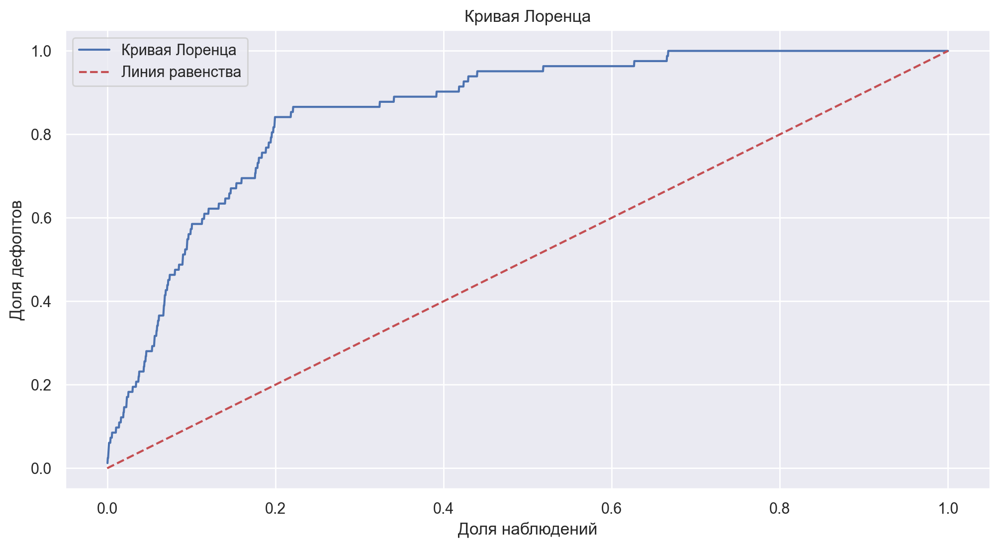

Gini-коэффициент - 0.7406


In [158]:
column_transformer = ColumnTransformer([
    ('mean-target', TargetEncoder(random_state=42), categorical),
    ('scaling', StandardScaler(), numeric)
], remainder="drop")

pipeline_rf = Pipeline([
    ('preprocessing', column_transformer),
    ('rf', RandomForestClassifier(
        **best_params_rf,
        random_state=42,
        n_jobs=-1
    ))
])

pipeline_rf.fit(X_train_under, y_train_under)
rf_pred = pipeline_rf.predict_proba(X_test)[:, 1]
auc_pr_rf = average_precision_score(y_test, rf_pred)
auc_roc_rf = roc_auc_score(y_test, rf_pred)
gini_rf = 2 * auc_roc_rf - 1

print('AUC-PR:', auc_pr_rf)
print('AUC-ROC:', auc_roc_rf)
depict_pr_roc(y_test, rf_pred, 'RandomForest')
plot_gini_curve(y_test, rf_pred)

metrics.loc['RandomForest'] = [
    auc_pr_rf,
    auc_roc_rf,
    gini_rf
]

SVM + RBF ядро

In [159]:
from sklearn.svm import SVC

column_transformer = ColumnTransformer([
    ('mean-target', TargetEncoder(random_state=42), categorical),
    ('scaling', StandardScaler(), numeric)
], remainder="drop")

def svm_objective(trial: Trial):
    C = trial.suggest_float("C", 1e-3, 1e3, log=True)
    gamma = trial.suggest_float("gamma", 1e-4, 1e-1, log=True)

    pipeline_svm = Pipeline([
        ('preprocessing', column_transformer),
        ('svm', SVC(
            kernel="rbf",
            C=C,
            gamma=gamma,
            probability=True,
            random_state=42
        ))
    ])

    pipeline_svm.fit(X_train_under, y_train_under)
    y_pred_proba = pipeline_svm.predict_proba(X_val)[:, 1]
    auc_pr = average_precision_score(y_val, y_pred_proba)
    return auc_pr

In [160]:
sampler_svm = TPESampler(seed=42)
study_svm = optuna.create_study(direction='maximize', sampler=sampler_svm)
study_svm.optimize(svm_objective, n_trials=50)

print("Лучшие параметры:", study_svm.best_params)
print("Лучший AUC-PR:", study_svm.best_value)

[I 2025-12-14 19:52:30,878] A new study created in memory with name: no-name-e94d430f-ed58-402a-97b9-fa65a03328a1
[I 2025-12-14 19:52:32,441] Trial 0 finished with value: 0.09842914117836851 and parameters: {'C': 0.1767016940294795, 'gamma': 0.07114476009343425}. Best is trial 0 with value: 0.09842914117836851.
[I 2025-12-14 19:52:36,232] Trial 1 finished with value: 0.0805865531068945 and parameters: {'C': 24.658329458549105, 'gamma': 0.006251373574521752}. Best is trial 0 with value: 0.09842914117836851.
[I 2025-12-14 19:52:37,300] Trial 2 finished with value: 0.02378190952902549 and parameters: {'C': 0.008632008168602538, 'gamma': 0.00029375384576328325}. Best is trial 0 with value: 0.09842914117836851.
[I 2025-12-14 19:52:38,093] Trial 3 finished with value: 0.03790277422043769 and parameters: {'C': 0.002231010801867922, 'gamma': 0.0396760507705299}. Best is trial 0 with value: 0.09842914117836851.
[I 2025-12-14 19:52:40,074] Trial 4 finished with value: 0.07192018984012222 and par

Лучшие параметры: {'C': 0.01358062960677218, 'gamma': 0.0968334532529056}
Лучший AUC-PR: 0.13041263986554943


In [161]:
best_params_svm = {'C': 0.01358062960677218, 'gamma': 0.0968334532529056}

AUC-PR: 0.14533105048613412
AUC-ROC: 0.7606084646323015


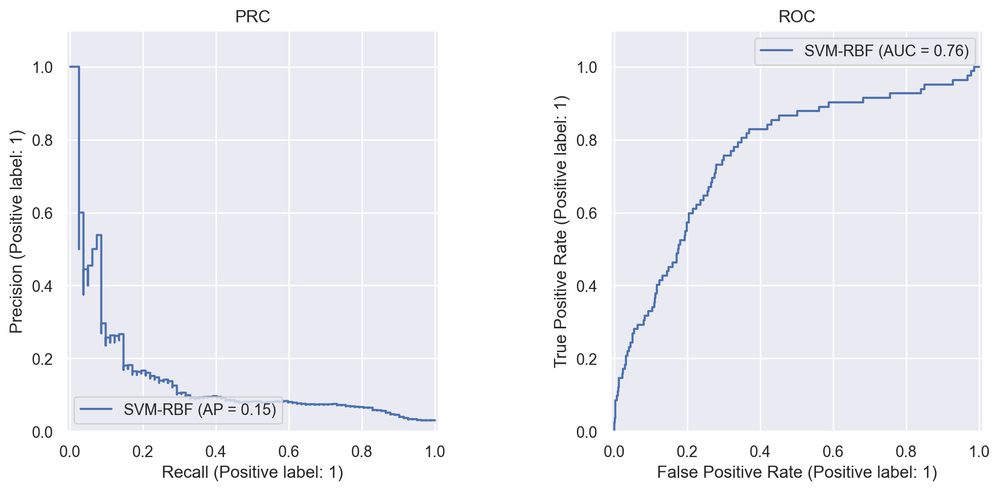

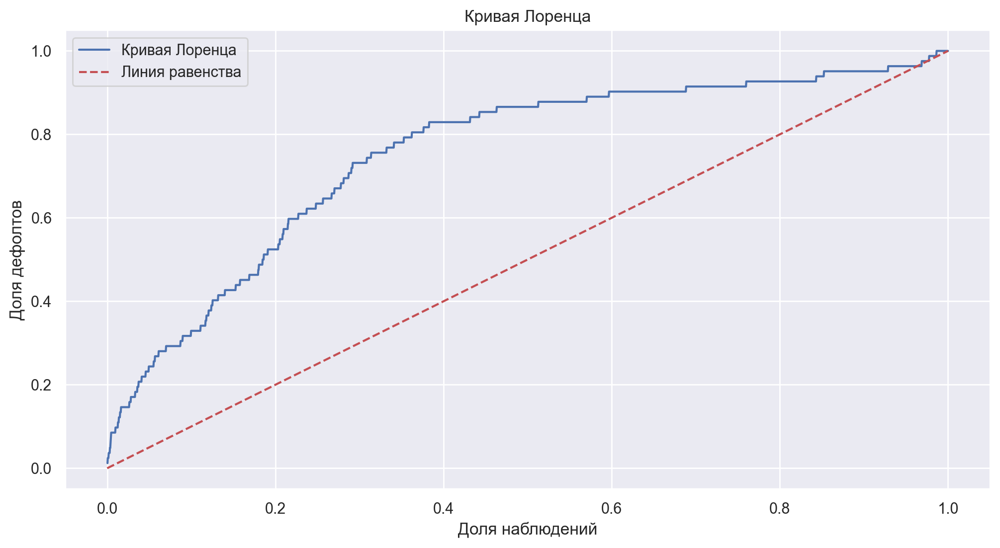

Gini-коэффициент - 0.5212


In [162]:
column_transformer = ColumnTransformer([
    ('mean-target', TargetEncoder(random_state=42), categorical),
    ('scaling', StandardScaler(), numeric)
], remainder="drop")

pipeline_svm = Pipeline([
    ('preprocessing', column_transformer),
    ('svm', SVC(
        kernel='rbf',
        C=best_params_svm['C'],
        gamma=best_params_svm['gamma'],
        probability=True,
        random_state=42
    ))
])

pipeline_svm.fit(X_train_under, y_train_under)
svm_pred = pipeline_svm.predict_proba(X_test)[:, 1]
auc_pr_svm = average_precision_score(y_test, svm_pred)
auc_roc_svm = roc_auc_score(y_test, svm_pred)
gini_svm = 2 * auc_roc_svm - 1

print('AUC-PR:', auc_pr_svm)
print('AUC-ROC:', auc_roc_svm)
depict_pr_roc(y_test, svm_pred, 'SVM-RBF')
plot_gini_curve(y_test, svm_pred)

metrics.loc['SVM-RBF'] = [
    auc_pr_svm,
    auc_roc_svm,
    gini_svm
]

In [163]:
metrics

,auc_pr,roc_auc_score,gini
CatBoost,0.227682,0.884889,0.769778
RandomForest,0.203016,0.870286,0.740572
SVM-RBF,0.145331,0.760608,0.521217


In [102]:
def calculate_gini_per_feature(X, y):
    gini_scores = {}
    for col in X.columns:
        gini = 2 * roc_auc_score(y, X[col]) - 1
        gini_scores[col] = abs(gini)

    gini_series = pd.Series(gini_scores).sort_values(ascending=False)
    plt.figure(figsize=(12, 6))
    sns.barplot(gini_series)
    plt.title('Коэффициент Джини по признакам')
    plt.ylabel('Коэффициент Джини')
    plt.xlabel('Признак')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    return gini_series

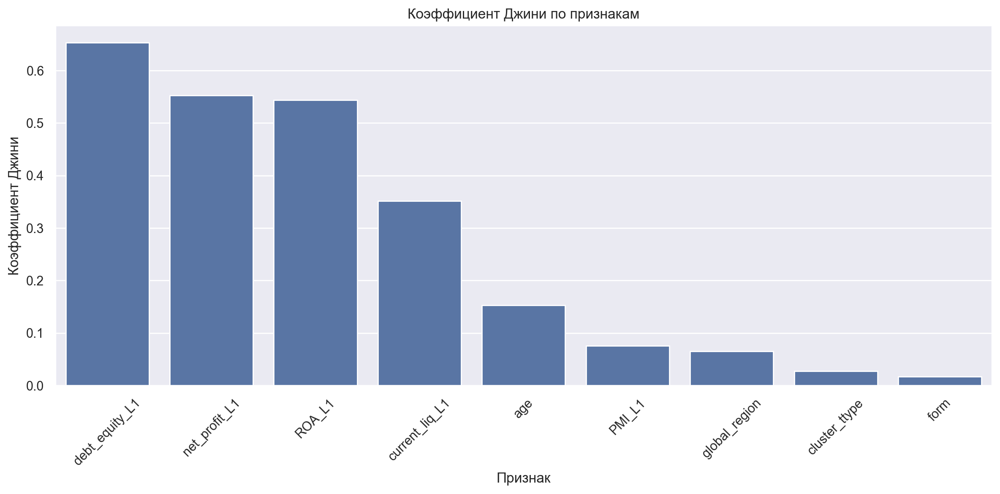

In [103]:
x_train_transformed = column_transformer.fit_transform(X_train_under, y_train_under)

x_train_transformed = pd.DataFrame(
    x_train_transformed,
    index=X_train_under.index,
    columns=categorical + numeric
)

x_test_transformed = column_transformer.fit_transform(X_test, y_test)

x_test_transformed = pd.DataFrame(
    x_test_transformed,
    index=X_test.index,
    columns=categorical + numeric
)

gini_per_feature = calculate_gini_per_feature(x_train_transformed, y_train_under)

### 6. Прибыль.

#### 1. LGD = 100%.

Оптимизируем порог на исторических данных с реальными дефолтами и посчитаем фактическую прибыль.

1. Если кредит выплачен $y = 0$, то прибыль:

$$\pi_i = F_i \cdot r$$

2. Если клиент не выполнил свои обязательства $y = 1$, то прибыль:

$$\pi_i = -F_i$$

Таким образом, суммарная фактическая прибыль при пороге $t$ равна:

$$\pi(t) = \sum_{i: p_i < t} \bigg[(1 - y_i) \cdot F_i r - y_i F_i\bigg]$$

Будем перебирать порог $t \in [0, 1]$ с шагом 0.05 на валидационной выборке. Оптимальный порог:

$$t^* = \text{arg max}_{t_j} \pi(t_j)$$

Вернем назад ИНН и присоединим по ним долги к валидационной и тестовой выборке

In [242]:
X_train["inn"] = main["inn"]
X_test["inn"] = main["inn"]

In [243]:
df = pd.read_excel("недейств.xlsx")
df.columns = df.iloc[2]
df = df.iloc[3:10003, 1:]
df = melting(df)

df = df[(df["Дата ликвидации"].dt.year == df["Год наблюдения"]) | (df["Дата ликвидации"].dt.year - df["Год наблюдения"] == 1) | (df["Дата ликвидации"].dt.year - df["Год наблюдения"] == 2)]
df["def"] = 0
df.loc[df["Дата ликвидации"].dt.year == df["Год наблюдения"], "def"] = 1
df.loc[df["Дата ликвидации"].dt.year - df["Год наблюдения"] == 1, "def"] = 1

non_lag_cols = ['Наименование', 'Год наблюдения', 'def',
    'Регистрационный номер', 'Краткое наименование','Дата регистрации',
    'Возраст компании, лет', 'Дата ликвидации', 'Статус',
    'Код налогоплательщика', 'Регион регистрации', 'Наименование ОКАТО',
    'Вид деятельности/отрасль', 'Организационно-правовая форма', 'Принадлежность к госсектору']

financial_cols = [c for c in df.columns if c not in non_lag_cols]
for col in financial_cols:
    df[f"{col} L1"] = df.groupby("Регистрационный номер")[col].shift(1)
lag1_cols = [c for c in df.columns if c.endswith("L1")]
df = df[non_lag_cols + lag1_cols]
df = df[(df["Дата ликвидации"].dt.year == df["Год наблюдения"]) | (df["Дата ликвидации"].dt.year - df["Год наблюдения"] == 1)]
df = df.dropna(subset=lag1_cols, how="all")
for col in lag1_cols:
    df[col] = df[col].astype(float)
df1 = df.copy()

In [244]:
df = pd.read_excel("действ.xlsx")
df.columns = df.iloc[2]
df = df.iloc[3:10003, 1:]

df = melting(df)
df["def"] = 0

non_lag_cols = ['Наименование', 'Год наблюдения', 'def',
    'Регистрационный номер', 'Краткое наименование','Дата регистрации',
    'Возраст компании, лет', 'Дата ликвидации', 'Статус',
    'Код налогоплательщика', 'Регион регистрации', 'Наименование ОКАТО',
    'Вид деятельности/отрасль', 'Организационно-правовая форма', 'Принадлежность к госсектору']

financial_cols = [c for c in df.columns if c not in non_lag_cols]
for col in financial_cols:
    df[f"{col} L1"] = df.groupby("Регистрационный номер")[col].shift(1)
lag1_cols = [c for c in df.columns if c.endswith("L1")]
df = df[non_lag_cols + lag1_cols]
df = df.dropna(subset=lag1_cols, how="all")
for col in lag1_cols:
    df[col] = df[col].astype(float)

In [245]:
full = pd.concat([df, df1])
full["debt"] = full["Заёмные средства (долгосрочные), RUB L1"] + full["Заёмные средства (краткосрочные), RUB L1"]
full = full[['Год наблюдения', 'Регистрационный номер', 'debt']]
full = full.rename(columns={'Год наблюдения': "year", 'Регистрационный номер': "inn"})
full.head(5)

Признак,year,inn,debt
1,2021,1156196067390,NaN
3,2023,1156196067390,NaN
4,2024,1156196067390,NaN
11,2021,1084101001126,NaN
12,2022,1084101001126,NaN


In [246]:
X_train_reset = X_train.reset_index(names=['original_x_train_index'])
X_test_reset = X_test.reset_index(names=['original_x_test_index'])

In [247]:
X_train_debts = pd.merge(X_train_reset, full, on=["inn", "year"], how="left")
X_train_debts.index = X_train_debts['original_x_train_index'].values
X_train_debts['y'] = y_train

X_test_debts = pd.merge(X_test_reset, full, on=["inn", "year"], how="left")
X_test_debts.index = X_test_debts['original_x_test_index'].values
X_test_debts['y'] = y_test

Получаем предикты модели

In [248]:
X_train_debts = X_train_debts.dropna()
X_test_debts = X_test_debts.dropna()
X_train_debts['pd'] = pipeline_cat.predict_proba(X_train_debts.drop(columns=["inn", "debt", "original_x_train_index"]))[:, 1]
X_test_debts['pd'] = pipeline_cat.predict_proba(X_test_debts.drop(columns=["inn", "debt", "original_x_test_index"]))[:, 1]

Перебираем порог и сохраняем прибыль

In [260]:
thresholds = np.linspace(0, 1, 201)
real_profit = []
for t in thresholds:
    accepted = X_train_debts[X_train_debts['pd'] < t]
    accepted['real_profit'] = np.where(accepted['y'] == 0,
                                       accepted['debt'] * 0.2,
                                       -0.7 * accepted['debt'])
    real_profit.append(accepted['real_profit'].sum())

C:\Users\Admin\AppData\Local\Temp\ipykernel_134832\3296470708.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  accepted['real_profit'] = np.where(accepted['y'] == 0,
C:\Users\Admin\AppData\Local\Temp\ipykernel_134832\3296470708.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  accepted['real_profit'] = np.where(accepted['y'] == 0,
C:\Users\Admin\AppData\Local\Temp\ipykernel_134832\3296470708.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

In [261]:
real_profit = np.array(real_profit)
t_real_opt = thresholds[np.argmax(real_profit)]
max_real_profit = real_profit[np.argmax(real_profit)]

Кривая прибыли

In [262]:
max_real_profit

8556103100.0

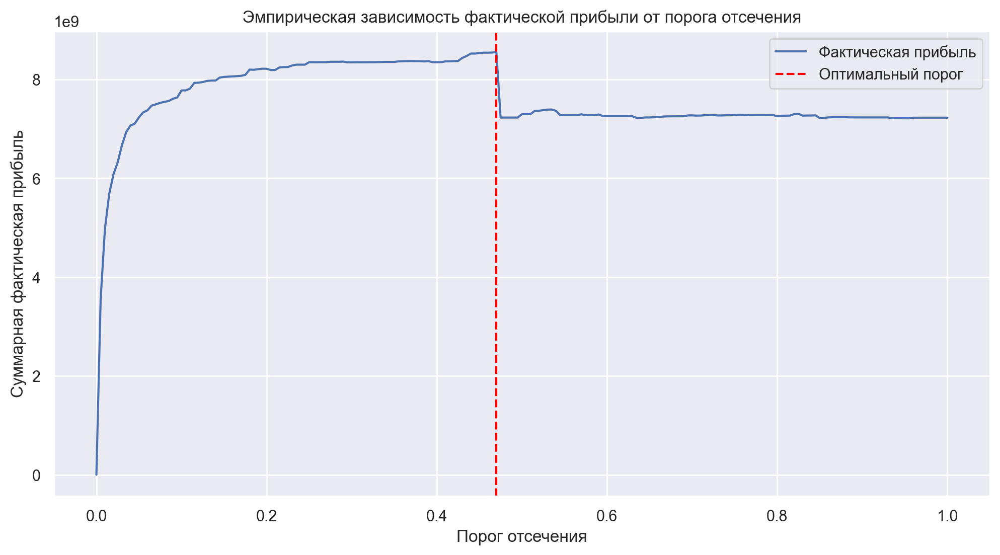

In [263]:
plt.plot(thresholds, real_profit, label='Фактическая прибыль')
plt.axvline(t_real_opt, color='red', linestyle='--', label='Оптимальный порог')
plt.xlabel('Порог отсечения')
plt.ylabel('Суммарная фактическая прибыль')
plt.title('Эмпирическая зависимость фактической прибыли от порога отсечения')
plt.legend()
plt.show()

In [258]:
from sklearn.metrics import precision_score, recall_score, confusion_matrix

X_test_debts["y_pred"] = (X_test_debts['pd'] >= t_real_opt).astype(int)
precision = precision_score(X_test_debts['y'], X_test_debts["y_pred"])
recall = recall_score(X_test_debts['y'], X_test_debts["y_pred"])
precision, recall

(0.13157894736842105, 0.25)

Матрица ошибок

In [ ]:
cm = confusion_matrix(X_test_debts['y'], X_test_debts["y_pred"])

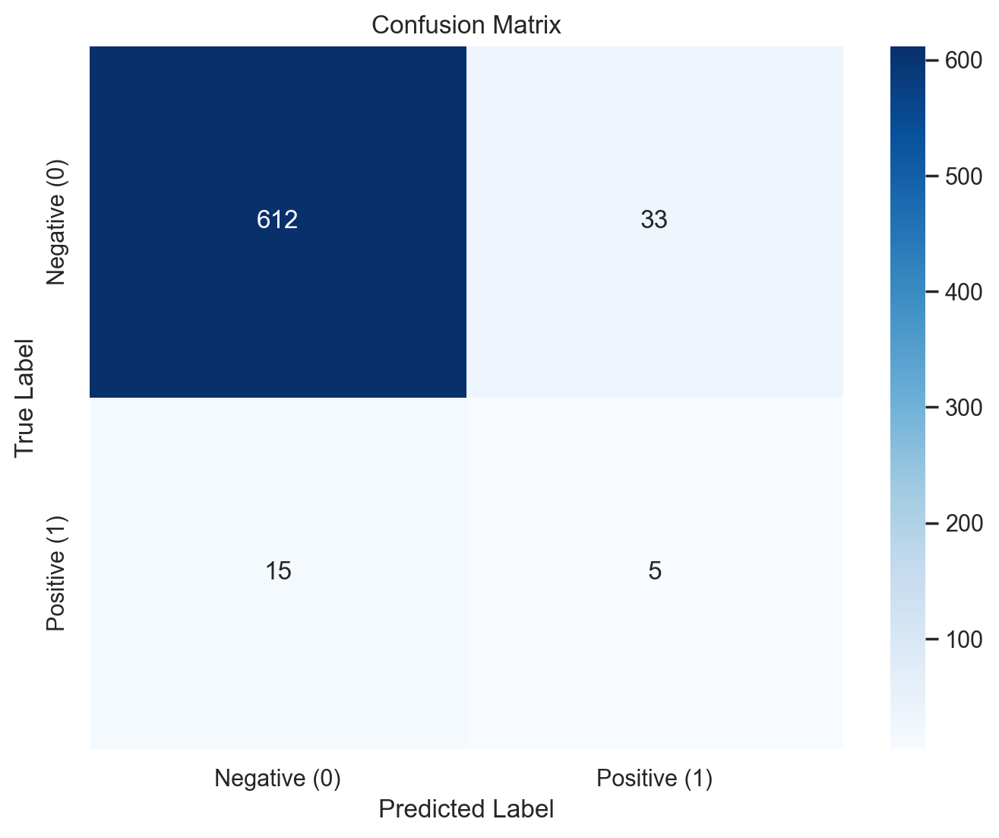

In [ ]:
class_names = ['Negative (0)', 'Positive (1)']
plt.figure(figsize=(8, 6))

sns.heatmap(
    cm,
    annot=True,       
    fmt='d',           
    cmap='Blues',    
    xticklabels=class_names, 
    yticklabels=class_names 
)

plt.title('Confusion Matrix')
plt.xlabel('Predicted Label') 
plt.ylabel('True Label')    
plt.show()